## Importing Packages

In [13]:
import glob
import cv2
import numpy as np
import os
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
from mpl_toolkits.mplot3d import axes3d, Axes3D
import pandas as pd
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
from matplotlib import gridspec 
#from sklearn.cluster import OPTICS, cluster_optics_dbscan 
from sklearn.preprocessing import normalize, StandardScaler 
%matplotlib notebook
# import napari
# #%matplotlib inline
# import napari
from numpy import *
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d
import imageio
import scipy
import json

#%matplotlib inline

## Reading files (input path)

In [14]:
# tif_file_iod = sorted(glob.glob(os.path.join(r"C:/Users/acoskun7/Documents/data/Nalm6alsoFig2101217/IodReplislices", "*.tif")))
# tif_file_phos = sorted(glob.glob(os.path.join(r"C:/Users/acoskun7/Documents/data/Nalm6alsoFig2101217/PhosNcell", "*.tif")))
# tif_file_rna = sorted(glob.glob(os.path.join(r"C:/Users/acoskun7/Documents/data/Nalm6alsoFig2101217/RNA", "*.tif")))

tif_file_rna = sorted(glob.glob(os.path.join(r"Y:\coskun-lab\Shambavi\Paper\Data\Converted Images\IN_Germinal_Images_PNG\PO_3-", "*.jpg")))
tif_file_iod = sorted(glob.glob(os.path.join(r"Y:\coskun-lab\Shambavi\Paper\Data\Converted Images\IN_Germinal_Images_PNG\CsWO-", "*.jpg")))
tif_file_phos = sorted(glob.glob(os.path.join(r"Y:\coskun-lab\Shambavi\Paper\Data\Converted Images\IN_Germinal_Images_PNG\C_3N-", "*.jpg")))

## Input range of slices

In [16]:
a = np.append(np.arange(25), np.arange(50, 75))
print(a)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72
 73 74]


## Calculating iodine, phos, rna values without zeros

In [17]:
rangevals = [0,150,0,150]

## Saving Cropped Images

In [7]:
path_current = os.getcwd()
path_folder = os.path.join(path_current,'Cropped Files4')
if os.path.isdir(path_folder) == False:
        os.mkdir(path_folder)

os.chdir(path_folder)
for k in a:
    iod_1 = tifffile.imread(tif_file_iod[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
    
#################################################################################################
#     tiff = TIFF.open('iod_cropped_' + str(k)  + '.tif', mode='w')
#     tiff.write_image(iod_1)
#     tiff.close()
#################################################################################################
#    scipy.misc.imsave('iod_cropped_' + str(k)  + '.tif', iod_1)
#################################################################################################
#    imageio.imwrite('iod_cropped_' + str(k)  + '.tif', iod_1)
#################################################################################################

    description = "This is my description"
    # Extratags
    metadata_tag = json.dumps({"ChannelIndex": 1, "Slice": int(k)})
    extra_tags = [("MicroManagerMetadata", 's', 0, metadata_tag, True),
                  ("ProcessingSoftware", 's', 0, "my_code", True)]
    # ImageJ metadata. 'Info' tag needs to be a string
    ijinfo = {"InitialPositionList": [{"Label": "Pos1"}, {"Label": "Pos3"}]}
    ijmetadata = {"Info": json.dumps(ijinfo)}
    # Write file
    tifffile.imsave(
        'iod_cropped_' + str(k)  + '.tif',
        iod_1,
        ijmetadata=ijmetadata,
        description=description,
        extratags=extra_tags,
    )


os.chdir(path_current)

In [8]:
path_current = os.getcwd()
path_folder = os.path.join(path_current,'Cropped Files2')
if os.path.isdir(path_folder) == False:
        os.mkdir(path_folder)

os.chdir(path_folder)
for k in a:
    phos_1 = tifffile.imread(tif_file_phos[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]

##################################################################################    
#     tiff = TIFF.open('iod_cropped_' + str(k)  + '.tif', mode='w')
#     tiff.write_image(iod_1)
#     tiff.close()
#    matplotlib.image.imsave('phos_cropped_' + str(k) + '.tif',phos_1)
##################################################################################
#    scipy.misc.imsave('phos_cropped_' + str(k)  + '.tif', phos_1)
##################################################################################
    
#    imageio.imwrite('phos_cropped_' + str(k)  + '.tif', phos_1)
##################################################################################
    description = "This is my description"
    # Extratags
    metadata_tag = json.dumps({"ChannelIndex": 2, "Slice": int(k)})
    extra_tags = [("MicroManagerMetadata", 's', 0, metadata_tag, True),
                  ("ProcessingSoftware", 's', 0, "my_code", True)]
    # ImageJ metadata. 'Info' tag needs to be a string
    ijinfo = {"InitialPositionList": [{"Label": "Pos1"}, {"Label": "Pos3"}]}
    ijmetadata = {"Info": json.dumps(ijinfo)}
    # Write file
    tifffile.imsave(
        'phos_cropped_' + str(k)  + '.tif',
        phos_1,
        ijmetadata=ijmetadata,
        description=description,
        extratags=extra_tags,
    )

os.chdir(path_current)

In [9]:
path_current = os.getcwd()
path_folder = os.path.join(path_current,'Cropped Files3')
if os.path.isdir(path_folder) == False:
        os.mkdir(path_folder)

os.chdir(path_folder)
for k in a:
    rna_1 = tifffile.imread(tif_file_rna[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
#################################################################################
#    matplotlib.image.imsave('rna_cropped_' + str(k) + '.tif',rna_1)
#    scipy.misc.imsave('rna_cropped_' + str(k)  + '.tif', rna_1)
#     tiff = TIFF.open('rna_cropped_' + str(k)  + '.tif', mode='w')
#     tiff.write_image(rna_1)
#     tiff.close() 
#################################################################################
#    imageio.imwrite('rna_cropped_' + str(k)  + '.tif', rna_1)
#################################################################################
    description = "This is my description"
    # Extratags
    metadata_tag = json.dumps({"ChannelIndex": 3, "Slice": int(k)})
    extra_tags = [("MicroManagerMetadata", 's', 0, metadata_tag, True),
                  ("ProcessingSoftware", 's', 0, "my_code", True)]
    # ImageJ metadata. 'Info' tag needs to be a string
    ijinfo = {"InitialPositionList": [{"Label": "Pos1"}, {"Label": "Pos3"}]}
    ijmetadata = {"Info": json.dumps(ijinfo)}
    # Write file
    tifffile.imsave(
        'rna_cropped_' + str(k)  + '.tif',
        rna_1,
        ijmetadata=ijmetadata,
        description=description,
        extratags=extra_tags,
    )

 
os.chdir(path_current)

In [1]:
iod_value = [] 
# phosphorous = [] 
# rna = [] 
x_count_iod = []
y_count_iod = []
z_count_iod = []
for k in a:
    zeros = 0
    iod_1 = cv2.imread(tif_file_iod[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
    print(iod_1)
    w,h = np.shape(iod_1)
    for i in range(w):
        for j in range(h): 
            if iod_1[i,j] == 0:
                continue
            else: 
                iod_value.append(iod_1[i,j])
                x_count_iod.append(i)
                y_count_iod.append(j)
                z_count_iod.append(k)
    
    #print("Zeros in layer {}: {}".format(k, zeros/(w*h)))



In [2]:
phos_value = [] 
# rna = [] 
x_count_phos = []
y_count_phos = []
z_count_phos = []
for k in a:
    
    iod_1 = tifffile.imread(tif_file_phos[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
    w,h = np.shape(iod_1)
    for i in range(w):
        for j in range(h): 
            if iod_1[i,j] == 0:
                continue
            else: 
                phos_value.append(iod_1[i,j])
                x_count_phos.append(i)
                y_count_phos.append(j)
                z_count_phos.append(k)

In [12]:
rna_value = [] 
# rna = [] 
x_count_rna = []
y_count_rna = []
z_count_rna = []
for k in a:
    iod_1 = tifffile.imread(tif_file_rna[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
    w,h = np.shape(iod_1)
    for i in range(w):
        for j in range(h): 
            if iod_1[i,j] == 0:
                continue
            else:
                rna_value.append(iod_1[i,j])
                x_count_rna.append(i)
                y_count_rna.append(j)
                z_count_rna.append(k)

## Calculating iodine,phos,rna all values with all the position coordinates. 

In [13]:
iodine = [] 
phosphorous = [] 
rna = [] 
x_count = []
y_count = []
z_count = []
for k in a:
    iod_1 = tifffile.imread(tif_file_iod[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
    phos_1 = tifffile.imread(tif_file_phos[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
    rna_1 = tifffile.imread(tif_file_rna[k])[rangevals[0]:rangevals[1],rangevals[2]:rangevals[3]]
    w,h = np.shape(iod_1)
    for i in range(w):
        for j in range(h): 
#             if iod_1[i,j] == 0 and phos_1[i,j] == 0  and rna_1[i,j] == 0:
#                 zeros += 1
#             else: 
            iodine.append(iod_1[i,j])
            phosphorous.append(phos_1[i,j])
            rna.append(rna_1[i,j])
            x_count.append(i)
            y_count.append(j)
            z_count.append(k)
    
    #print("Zeros in layer {}: {}".format(k, zeros/(w*h)))
X = pd.DataFrame({'Column1': iodine, 'Column2': phosphorous,'Column3': rna})#,'Column4': x_count, 'Column5': y_count,'Column6': z_count})

## PCA

In [14]:
x = StandardScaler().fit_transform(X)

In [15]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [16]:
principalComponents[:,0]

array([-0.27579282, -0.95585818, -0.95585818, ..., -0.10657037,
        0.59857693, -1.44161915])

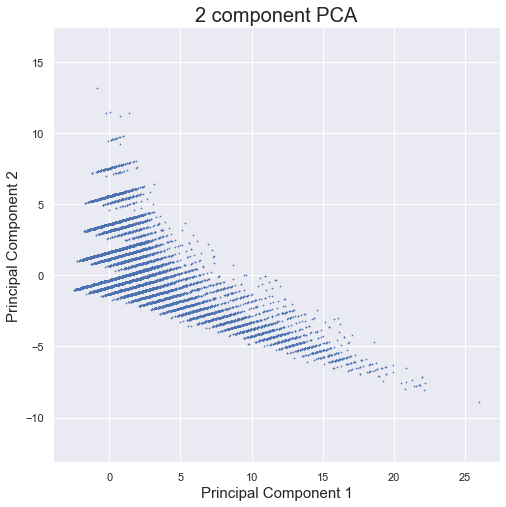

In [17]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
plt.scatter(principalComponents[:, 0], principalComponents[:, 1],s=0.5)
plt.axis('equal');

## Clustering Algorithms

In [18]:
scaler = StandardScaler() 
X_scaled = scaler.fit_transform(X) 
X_normalized = normalize(X_scaled) 
X_normalized = pd.DataFrame(X_normalized) 
kmeans = KMeans(n_clusters=6, random_state=111)
kmeans.fit(X_normalized)
kmeans.labels_

array([3, 1, 1, ..., 5, 0, 1])

In [19]:
kmeans_list = list(kmeans.labels_)
kmeans_list = kmeans_list
x_list = x_count
y_list = y_count
z_list = z_count

## Plotting all the clusters

In [20]:
# fig = plt.figure()
# ax = Axes3D(fig) 
# ax.scatter3D(x_list,y_list,z_list,c = kmeans_list, s = 3, alpha = 0.1)


## Seperating Clusters

In [21]:
zeros_indices = [i for i, x in enumerate(kmeans_list) if x == 0]    
one_indices = [i for i, x in enumerate(kmeans_list) if x == 1]
two_indices = [i for i, x in enumerate(kmeans_list) if x == 2]
three_indices = [i for i, x in enumerate(kmeans_list) if x == 3]
four_indices = [i for i, x in enumerate(kmeans_list) if x == 4]
five_indices = [i for i, x in enumerate(kmeans_list) if x == 5]

## Variables containing the coordinates of iodine, rna, Phosporous

In [22]:
iodine_array = np.c_[x_count_iod,y_count_iod,z_count_iod]
phos_array = np.c_[x_count_phos,y_count_phos,z_count_phos]
rna_array = np.c_[x_count_rna,y_count_rna,z_count_rna]

## define the clusters into seperate arrays

In [23]:
def array_def(x_list,y_list,z_list,zeros_indices):
    T,W,V= [x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices]
    zero_array = np.c_[T,W,V]
    zero_array_class = np.c_[zero_array,np.ones(len(zero_array))]
    return zero_array,zero_array_class

In [24]:
zero_array, zero_array_class = array_def(x_list,y_list,z_list,zeros_indices)
one_array, one_array_class = array_def(x_list,y_list,z_list,one_indices)
two_array, two_array_class = array_def(x_list,y_list,z_list,two_indices)
three_array, three_array_class = array_def(x_list,y_list,z_list,three_indices)
four_array, four_array_class = array_def(x_list,y_list,z_list,four_indices)
five_array, five_array_class = array_def(x_list,y_list,z_list,five_indices)

In [25]:
zero_array

array([[  0,  23,   0],
       [  0,  24,   0],
       [  0,  25,   0],
       ...,
       [ 99,  42, 100],
       [ 99,  46, 100],
       [ 99,  75, 100]])

In [27]:
from ordered_set import OrderedSet

x_hashable = map(tuple, zero_array)
zero_set = OrderedSet(x_hashable)

x_hashable = map(tuple, one_array)
one_set = OrderedSet(x_hashable)

x_hashable = map(tuple, two_array)
two_set = OrderedSet(x_hashable)

x_hashable = map(tuple, three_array)
three_set = OrderedSet(x_hashable)

x_hashable = map(tuple, four_array)
four_set = OrderedSet(x_hashable)

x_hashable = map(tuple, five_array)
five_set = OrderedSet(x_hashable)

x_hashable = map(tuple, phos_array)
phos_set = OrderedSet(x_hashable)

x_hashable = map(tuple, rna_array)
rna_set = OrderedSet(x_hashable)

x_hashable = map(tuple, iodine_array)
iodine_set = OrderedSet(x_hashable)

## Operations for finding seperate points in clusters/iodine/phos/rna

In [28]:
wow_r0 = np.array(list(zero_set.intersection(rna_set)))
wow_r1 = np.array(list(one_set.intersection(rna_set)))
wow_r2 = np.array(list(two_set.intersection(rna_set)))
wow_r3 = np.array(list(three_set.intersection(rna_set)))
wow_r4 = np.array(list(four_set.intersection(rna_set)))
wow_r5 = np.array(list(five_set.intersection(rna_set)))

wow_i0 = np.array(list(zero_set.intersection(iodine_set)))
wow_i1 = np.array(list(one_set.intersection(iodine_set)))
wow_i2 = np.array(list(two_set.intersection(iodine_set)))
wow_i3 = np.array(list(three_set.intersection(iodine_set)))
wow_i4 = np.array(list(four_set.intersection(iodine_set)))
wow_i5 = np.array(list(five_set.intersection(iodine_set)))

wow_p0 = np.array(list(zero_set.intersection(phos_set)))
wow_p1 = np.array(list(one_set.intersection(phos_set)))
wow_p2 = np.array(list(two_set.intersection(phos_set)))
wow_p3 = np.array(list(three_set.intersection(phos_set)))
wow_p4 = np.array(list(four_set.intersection(phos_set)))
wow_p5 = np.array(list(five_set.intersection(phos_set)))

In [29]:
def intersect_fn(zero_set,iodine_set,iod_value):
    final_iodine_zero = np.zeros(len(zero_set))
    iod_ordered = zero_set.intersection(iodine_set)
    lol = OrderedSet(iod_ordered).intersection(zero_set)
    iodine_cluster_zero = []
    for i in range(len(lol)):
        final_iodine_zero[zero_set.index(lol[i])] = iod_value[iodine_set.index(lol[i])]
        iodine_cluster_zero.append(iod_value[iodine_set.index(lol[i])])
    return final_iodine_zero, iodine_cluster_zero

In [30]:
final_iodine_zero, iodine_cluster_zero = intersect_fn(zero_set,iodine_set,iod_value)
final_iodine_one, iodine_cluster_one = intersect_fn(one_set,iodine_set,iod_value)
final_iodine_two, iodine_cluster_two = intersect_fn(two_set,iodine_set,iod_value)
final_iodine_three, iodine_cluster_three = intersect_fn(three_set,iodine_set,iod_value)
final_iodine_four, iodine_cluster_four = intersect_fn(four_set,iodine_set,iod_value)
final_iodine_five, iodine_cluster_five = intersect_fn(five_set,iodine_set,iod_value)

In [31]:
print(len(final_iodine_zero))
print(len(final_iodine_one))
print(len(final_iodine_two))
print(len(final_iodine_three))
print(len(final_iodine_four))
print(len(final_iodine_five))

214378
255342
68212
121066
43683
75019


In [32]:
final_rna_zero, rna_cluster_zero = intersect_fn(zero_set,rna_set,rna_value)
final_rna_one, rna_cluster_one = intersect_fn(one_set,rna_set,rna_value)
final_rna_two, rna_cluster_two = intersect_fn(two_set,rna_set,rna_value)
final_rna_three, rna_cluster_three = intersect_fn(three_set,rna_set,rna_value)
final_rna_four, rna_cluster_four = intersect_fn(four_set,rna_set,rna_value)
final_rna_five, rna_cluster_five = intersect_fn(five_set,rna_set,rna_value)

In [33]:
final_phos_zero,phos_cluster_zero = intersect_fn(zero_set,phos_set,phos_value)
final_phos_one,phos_cluster_one = intersect_fn(one_set,phos_set,phos_value)
final_phos_two,phos_cluster_two = intersect_fn(two_set,phos_set,phos_value)
final_phos_three,phos_cluster_three = intersect_fn(three_set,phos_set,phos_value)
final_phos_four,phos_cluster_four = intersect_fn(four_set,phos_set,phos_value)
final_phos_five,phos_cluster_five = intersect_fn(five_set,phos_set,phos_value)

## Normalizing the groups

In [34]:
final_iodine_two_normalized = (final_iodine_two-np.min(final_iodine_two))/np.ptp(final_iodine_two)
final_iodine_four_normalized = (final_iodine_four-np.min(final_iodine_four))/np.ptp(final_iodine_four)
final_rna_two_normalized = (final_rna_two-np.min(final_rna_two))/np.ptp(final_rna_two)
final_rna_four_normalized = (final_rna_four-np.min(final_rna_four))/np.ptp(final_rna_four)
final_phos_zero_normalized = (final_phos_zero-np.min(final_phos_zero))/np.ptp(final_phos_zero)
final_phos_one_normalized = (final_phos_one-np.min(final_phos_one))/np.ptp(final_phos_one)
final_phos_two_normalized = (final_phos_two-np.min(final_phos_two))/np.ptp(final_phos_two)
final_phos_three_normalized = (final_phos_three-np.min(final_phos_three))/np.ptp(final_phos_three)
final_phos_four_normalized = (final_phos_four-np.min(final_phos_four))/np.ptp(final_phos_four)
final_phos_five_normalized = (final_phos_five-np.min(final_phos_five))/np.ptp(final_phos_five)

## Density Plot with mayavi 

In [35]:
# import numpy as np
# from scipy import stats
# from mayavi import mlab

# mu, sigma = 0, 0.1 
# xyz = np.vstack([three_array[:,0],three_array[:,1],three_array[:,2]])
# kde = stats.gaussian_kde(xyz)
# density = kde(xyz)

# # Plot scatter with mayavi
# # figure = mlab.figure('DensityPlot')
# # pts = mlab.points3d(three_array[:,0],three_array[:,1],three_array[:,2], density, scale_mode='none', scale_factor=0.5)
# # mlab.axes()
# # mlab.show()


# # Plot scatter with mayavi
# figure = mlab.figure('DensityPlot')
# pts = mlab.quiver3d(three_array[:,0],three_array[:,1],three_array[:,2], scale_mode='none', scale_factor=0.5)
# mlab.axes()
# mlab.show()

## Bar Graph for final sum count

Text(0.5, 1.0, '2nd Cluster')

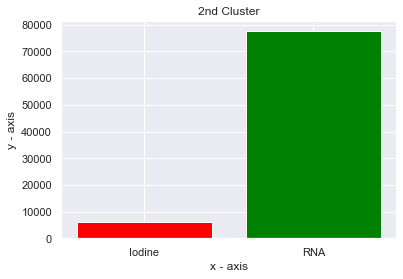

In [36]:
fig = plt.figure()
ax = fig.add_subplot(111)

# x-coordinates of left sides of bars  
left = [1, 2] 
  
# heights of bars 
height = [sum(final_iodine_two),sum(final_rna_two)] 
  
# labels for bars 
tick_label = ['Iodine', 'RNA'] 
  
# plotting a bar chart 
plt.bar(left, height, tick_label = tick_label, 
        width = 0.8, color = ['red', 'green']) 
  
# naming the x-axis 
plt.xlabel('x - axis') 
# naming the y-axis 
plt.ylabel('y - axis') 
# plot title 
plt.title('2nd Cluster') 

Text(0.5, 1.0, '4th Cluster')

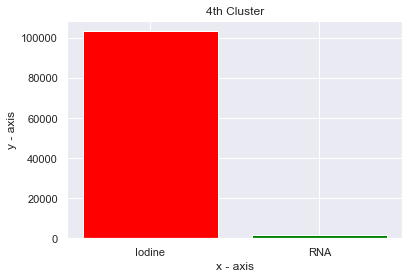

In [37]:
fig = plt.figure()
ax = fig.add_subplot(111)

# x-coordinates of left sides of bars  
left = [1, 2] 
  
# heights of bars 
height = [sum(final_iodine_four),sum(final_rna_four)] 
  
# labels for bars 
tick_label = ['Iodine', 'RNA'] 
  
# plotting a bar chart 
plt.bar(left, height, tick_label = tick_label, 
        width = 0.8, color = ['red', 'green']) 
  
# naming the x-axis 
plt.xlabel('x - axis') 
# naming the y-axis 
plt.ylabel('y - axis') 
# plot title 
plt.title('4th Cluster') 

## Histogram plots

In [38]:
# fig = plt.figure()
# ax = fig.add_subplot(111)

# plt.hist(final_iodine_two[final_iodine_two != 0], bins= 30)

# ax = fig.add_subplot(211)

# plt.hist(final_rna_two, bins= 30)
# plt.show()

In [39]:
# fig = plt.figure()
# ax = fig.add_subplot(111)

# plt.hist(final_iodine_four,bins= 30)

# ax = fig.add_subplot(211)

# plt.hist(final_rna_four,bins= 30)
# plt.show()

## Heat Map with different commands and colour maps

In [40]:
heat_map_iod = [sum(final_iodine_zero),sum(final_iodine_one),sum(final_iodine_two),sum(final_iodine_three),sum(final_iodine_four),sum(final_iodine_five)]
heat_map_rna = [sum(final_rna_zero),sum(final_rna_one),sum(final_rna_two),sum(final_rna_three),sum(final_rna_four),sum(final_rna_five)]
heat_map_phos = [sum(final_phos_zero),sum(final_phos_one),sum(final_phos_two),sum(final_phos_three),sum(final_phos_four),sum(final_phos_five)]
X = pd.DataFrame({'Iodine': heat_map_iod, 'Phosphorous': heat_map_phos,'RNA': heat_map_rna})
X = np.log(X)



C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


In [41]:

biomarkers = ["Iodine","Phosphorous","RNA"]
clusters = ["first", "second", "third",
           "fourth", "fifth", "sixth"]

pixel_values = np.c_[heat_map_iod,heat_map_phos,heat_map_rna]
pixel_values.transpose()

array([[6.235000e+03, 3.609000e+03, 6.030000e+03, 0.000000e+00,
        1.034350e+05, 6.264000e+03],
       [6.927834e+06, 4.508953e+06, 2.086254e+06, 2.960828e+06,
        1.071402e+06, 1.436471e+06],
       [2.000000e+00, 0.000000e+00, 7.758600e+04, 0.000000e+00,
        1.587000e+03, 8.632800e+04]])

In [42]:
# import seaborn as sns
# X.rename(index={0:'zero',1:'one',2:'two',3:'three',4:'four',5:'five'})
# plt.figure(figsize=(6,3))
# sns.heatmap(X_not_log.transpose(), linewidths=.5)
# plt.show()

In [43]:
from numpy import inf
heat_map_iod = [sum(final_iodine_zero),sum(final_iodine_one),sum(final_iodine_two),sum(final_iodine_three),sum(final_iodine_four),sum(final_iodine_five)]
heat_map_rna = [sum(final_rna_zero),sum(final_rna_one),sum(final_rna_two),sum(final_rna_three),sum(final_rna_four),sum(final_rna_five)]
heat_map_phos = [sum(final_phos_zero),sum(final_phos_one),sum(final_phos_two),sum(final_phos_three),sum(final_phos_four),sum(final_phos_five)]


## Zscore code

In [176]:
>>> from scipy.cluster import hierarchy
>>> import matplotlib.pyplot as plt

<IPython.core.display.Javascript object>


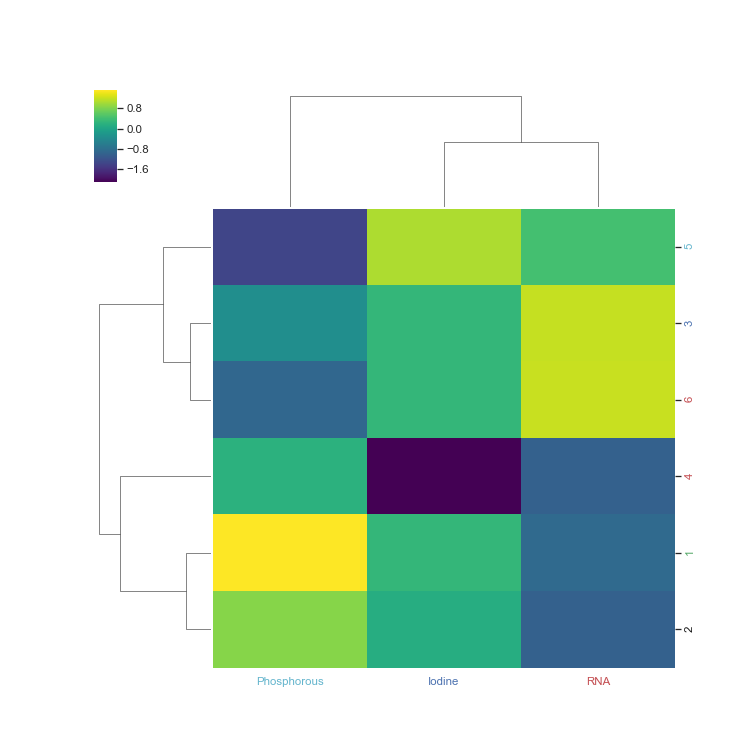

In [188]:
iod_zscore= scipy.stats.zscore(heat_map_iod, axis = 0)
rna_zscore= scipy.stats.zscore(heat_map_rna, axis = 0)
phos_zscore= scipy.stats.zscore(heat_map_phos, axis = 0)
X_zscore = pd.DataFrame({'Iodine': iod_zscore, 'RNA': rna_zscore,'Phosphorous': phos_zscore})
name = ['1','2','3','4','5','6']
X_zscore['Name'] = name
X_zscore = X_zscore.set_index('Name')
del X_zscore.index.name

cbar_kws = {"shrink":1
            }
# Cluster map without standardisation
g = sns.clustermap(X_zscore,cmap="viridis")


#PLease replace colours with 'w'

my_colors = ['c', 'b', 'r', 'r', 'g', 'k', 'b']

for ticklabel, tickcolor in zip(g.ax_heatmap.axes.get_yticklabels(), my_colors):
    ticklabel.set_color(tickcolor)

for ticklabel, tickcolor in zip(g.ax_heatmap.axes.get_xticklabels(), my_colors):
    ticklabel.set_color(tickcolor)

# hierarchy.set_link_color_palette([mpl.colors.rgb2hex(rgb[:3]) for rgb in cmap])
#Cluster map with Standardisation
#sns.clustermap(X_zscore,standard_scale = 1,cmap="viridis")

## For the colum(top links)

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


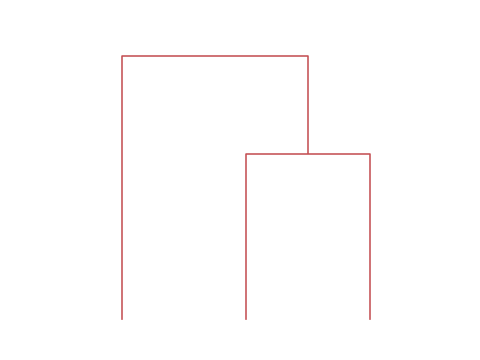

In [196]:
Z = hierarchy.linkage(X_zscore.transpose(), 'single')

fig = plt.figure()
ax = fig.add_subplot(111)
hierarchy.set_link_color_palette(['r', 'r', 'r', 'r'])

dn1 = hierarchy.dendrogram(Z, above_threshold_color='r',
                            orientation='top')

# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False


# Now set color to white (or whatever is "invisible")
ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])

plt.show()


## For the row(left links)

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


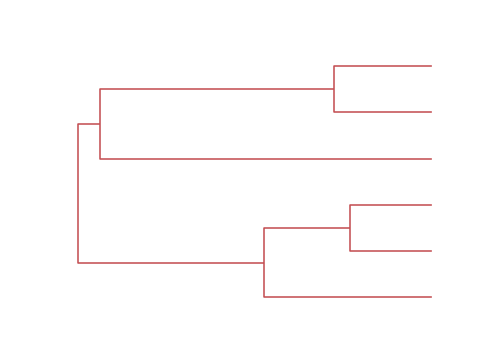

In [197]:
Z = hierarchy.linkage(X_zscore, 'single')

fig = plt.figure()
ax = fig.add_subplot(111)

hierarchy.set_link_color_palette(['r', 'r', 'r', 'r'])

dn1 = hierarchy.dendrogram(Z, above_threshold_color='r',
                            orientation='left')
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False


# Now set color to white (or whatever is "invisible")
ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:


frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])

plt.show()

## Normal Heat map 

<IPython.core.display.Javascript object>


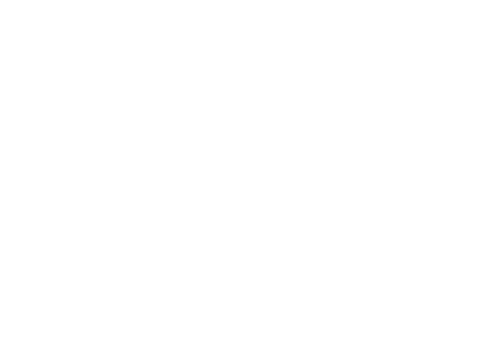

In [45]:
X=X_zscore.transpose()
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111)
X = X
columns = ["first", "second", "third",
           "fourth", "fifth", "sixth"]
index = ["RNA","Phosphorous","Iodine"]
plt.pcolor(X,cmap = 'tab20b')
plt.yticks(np.arange(0.5, len(index), 1), index)
plt.xticks(np.arange(0.5, len(columns), 1), columns)
plt.colorbar()
plt.show()

## Back to heat map Code

In [46]:

# ## this is log transformation 
heat_map_iod = np.log(heat_map_iod)
heat_map_iod = np.where(heat_map_iod== -inf , 0, heat_map_iod)

heat_map_rna = np.log(heat_map_rna)
heat_map_rna = np.where(heat_map_rna == -inf , 0, heat_map_rna)

heat_map_phos = np.log(heat_map_phos)
heat_map_phos = np.where(heat_map_phos == -inf , 0, heat_map_phos)

X = pd.DataFrame({'Iodine': heat_map_iod, 'RNA': heat_map_rna,'Phosphorous': heat_map_phos})
X

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in log
  
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """


,Iodine,RNA,Phosphorous
0,8.737934,0.693147,15.751058
1,8.191186,0.000000,15.321576
2,8.704502,11.259142,14.550881
3,0.000000,0.000000,14.900980
4,11.546699,7.369601,13.884479
5,8.742574,11.365909,14.177700


<IPython.core.display.Javascript object>


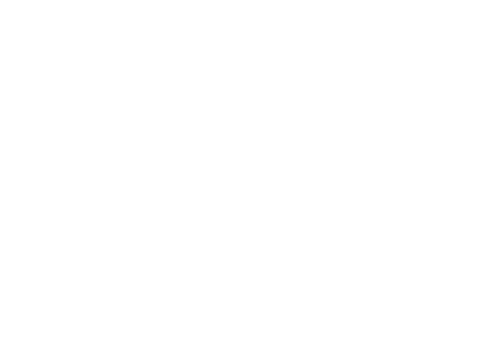

In [47]:
d = pd.DataFrame({'1': heat_map_iod, '2': heat_map_phos,'3': heat_map_rna})
fig = plt.figure()
ax = fig.add_subplot(111)
sns.heatmap(d)

<IPython.core.display.Javascript object>


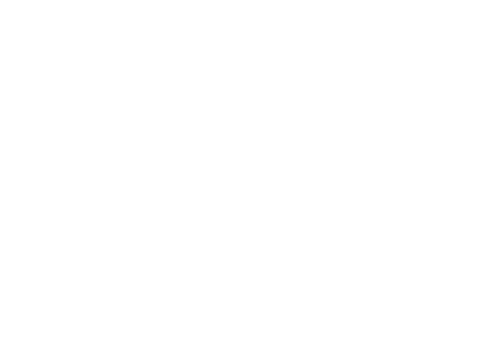

In [48]:
%matplotlib notebook
columns = ["RNA","Iodine", "Phosphorous"]
index = ["first", "second", "third",
           "fourth", "fifth", "sixth"]
plt.pcolor(X,cmap = 'Reds')
plt.yticks(np.arange(0.5, len(index), 1), index)
plt.xticks(np.arange(0.5, len(columns), 1), columns)
plt.colorbar()
plt.show()

In [49]:
X = X.transpose()

<IPython.core.display.Javascript object>


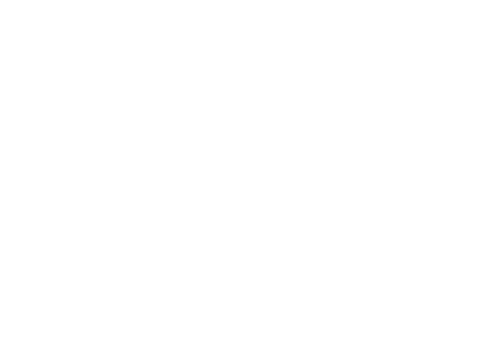

In [50]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111)
X = X
columns = ["first", "second", "third",
           "fourth", "fifth", "sixth"]
index = ["RNA","Phosphorous","Iodine"]
plt.pcolor(X,cmap = 'tab20b')
plt.yticks(np.arange(0.5, len(index), 1), index)
plt.xticks(np.arange(0.5, len(columns), 1), columns)
plt.colorbar()
plt.show()

<IPython.core.display.Javascript object>


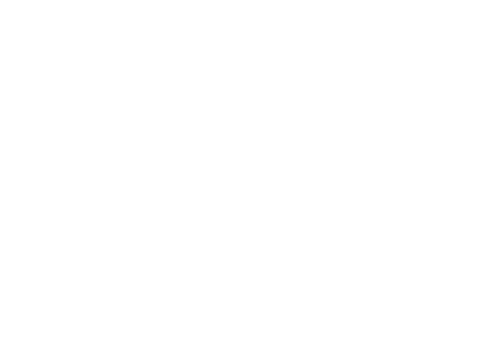

In [51]:
fig = plt.figure()
ax = fig.add_subplot(111)
X = X
columns = ["first", "second", "third",
           "fourth", "fifth", "sixth"]
index = ["Iodine","Phosphorous","RNA"]
plt.pcolor(X,cmap = 'tab20b')
plt.yticks(np.arange(0.5, len(index), 1), index)
plt.xticks(np.arange(0.5, len(columns), 1), columns)
plt.colorbar()
plt.show()

## Plotting the clusters 0

<IPython.core.display.Javascript object>


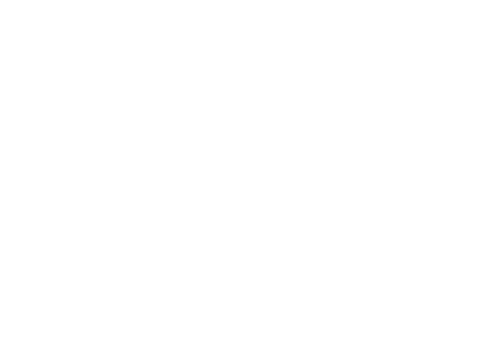

In [52]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D(zero_array[:,0],zero_array[:,1],zero_array[:,2], c = 'red' , alpha= 0.8 ,s = 0.005)

#fig.colorbar(img)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])

plt.show()

## Plotting cluster zero, with iodine points

<IPython.core.display.Javascript object>


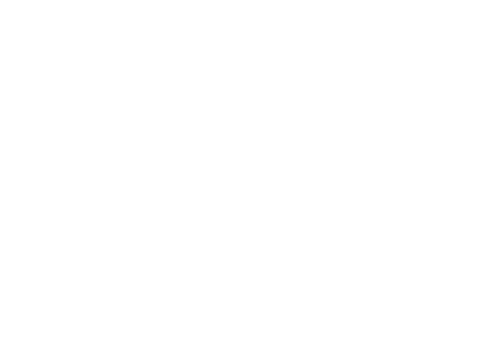

In [53]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],c = final_iodine_zero ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

## Plottingzero cluster with rna

<IPython.core.display.Javascript object>


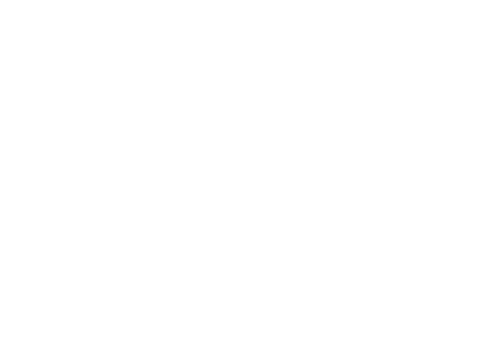

In [54]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],c = final_rna_zero ,alpha= 0.8, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

## Zero Cluster with PHosphorous

<IPython.core.display.Javascript object>


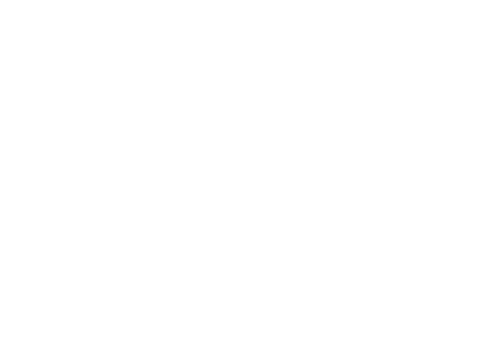

In [55]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],c = final_phos_zero ,alpha= 1, cmap='Pastel1',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

## Cluster one with iodine

<IPython.core.display.Javascript object>


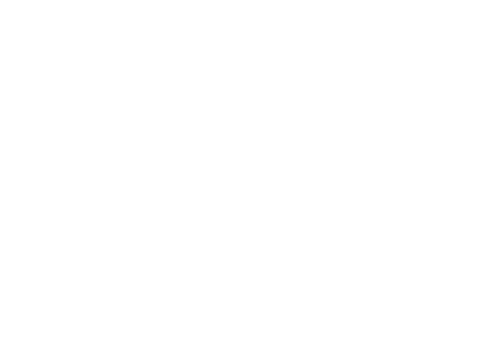

In [56]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],c = final_iodine_one ,alpha= 0.1, cmap='cool',s = 9)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

## Cluster 1 with RNA

<IPython.core.display.Javascript object>


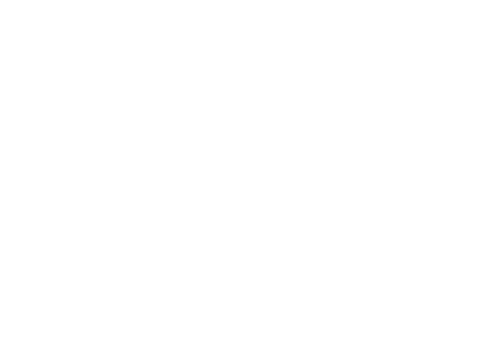

In [57]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],c = final_rna_one ,alpha= 0.1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

## Cluster one with PHosphorous

<IPython.core.display.Javascript object>


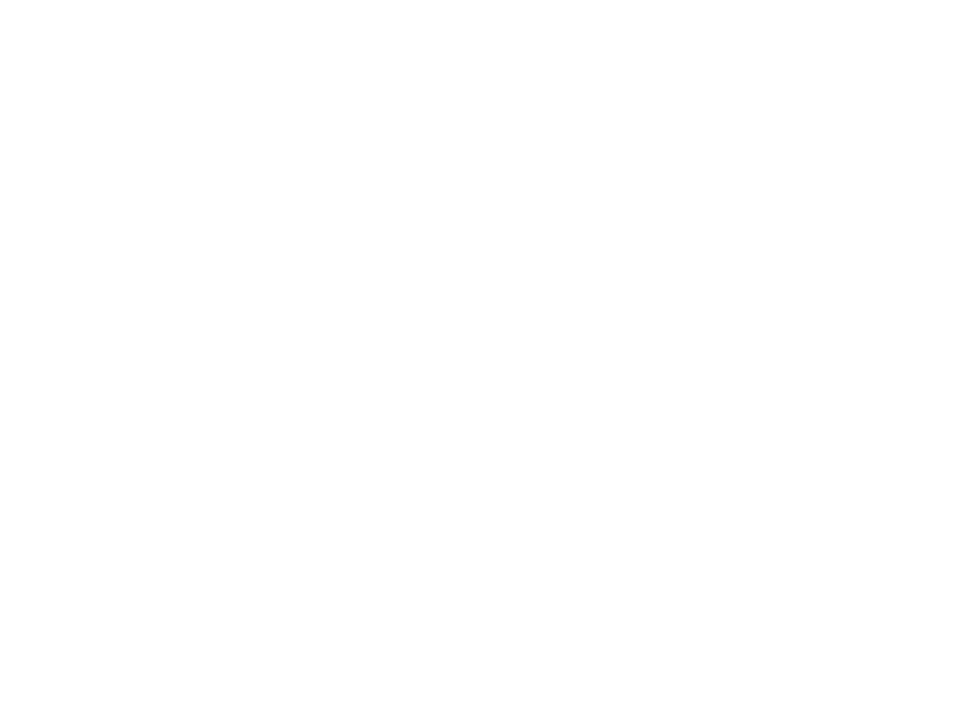

In [58]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],c = final_phos_one ,alpha= 0.1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

## Same thing with differnet clusters and biomarkers

<IPython.core.display.Javascript object>


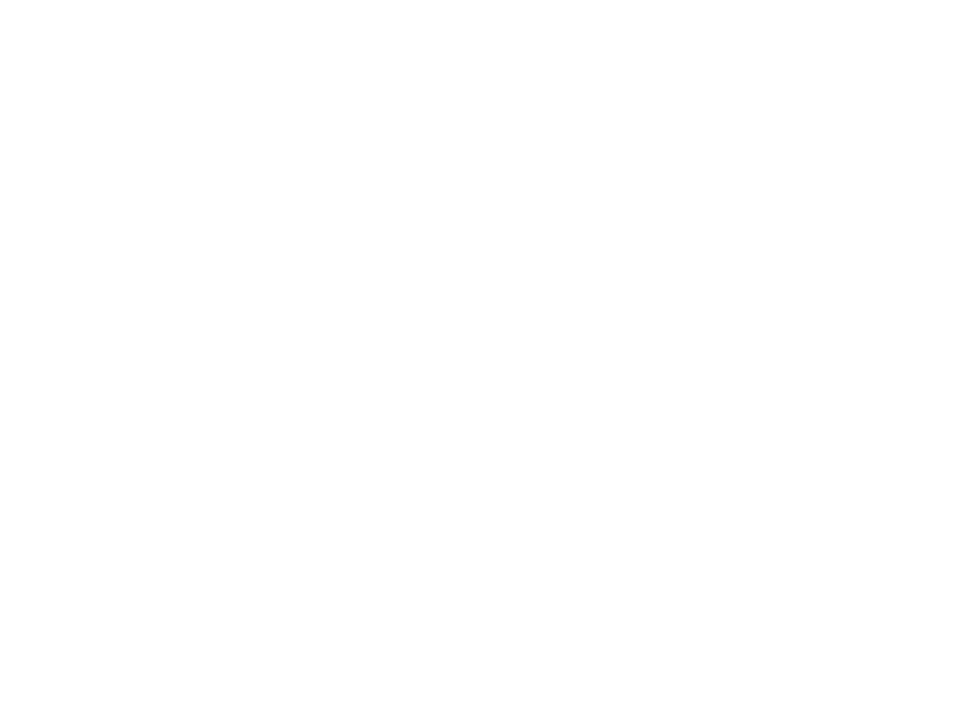

In [59]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],c = final_phos_two ,alpha= 0.5, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


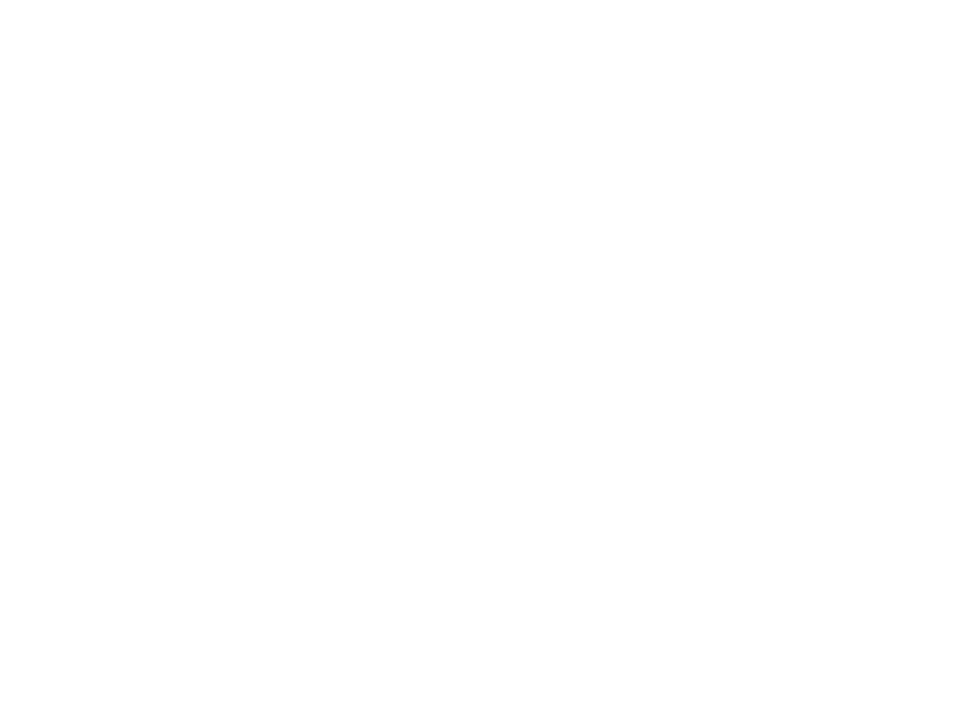

In [60]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],c = final_rna_two ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


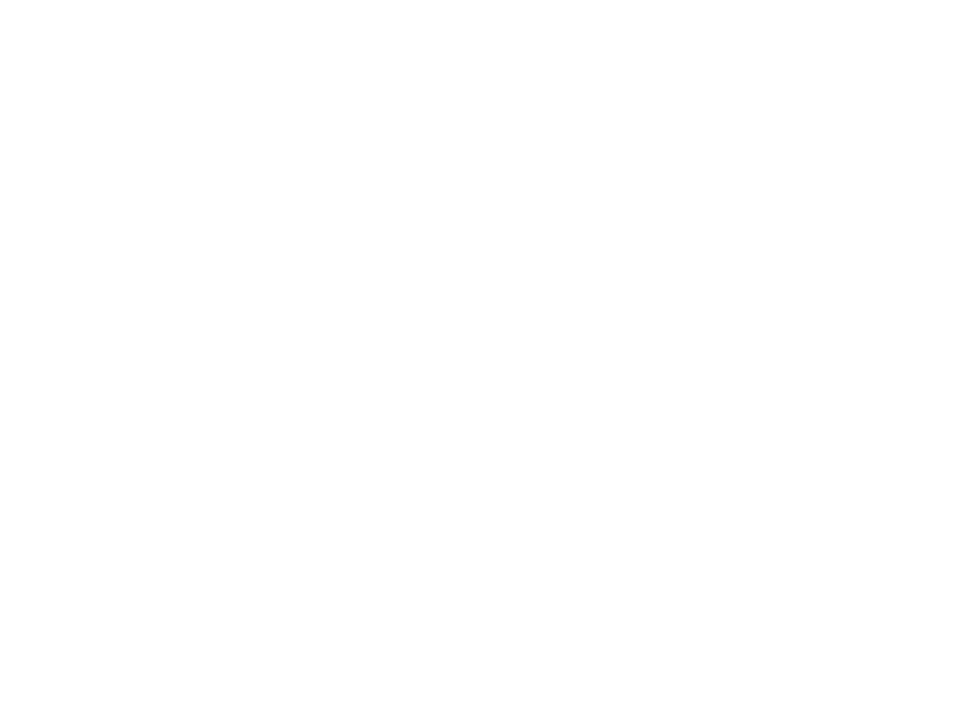

In [61]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],c = final_iodine_two ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


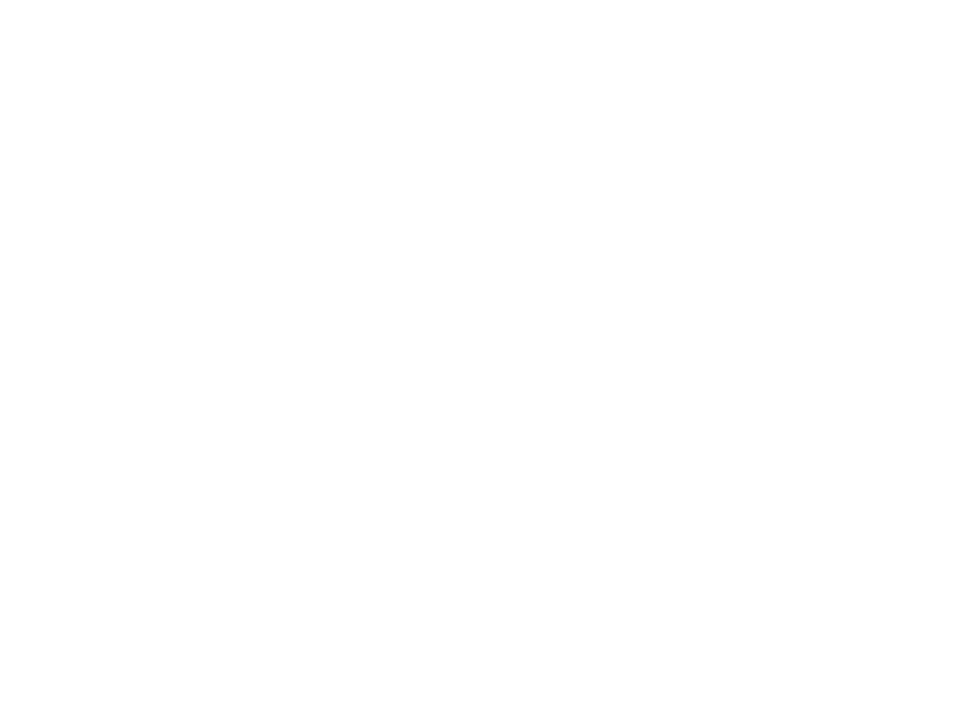

In [62]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_iodine_three ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


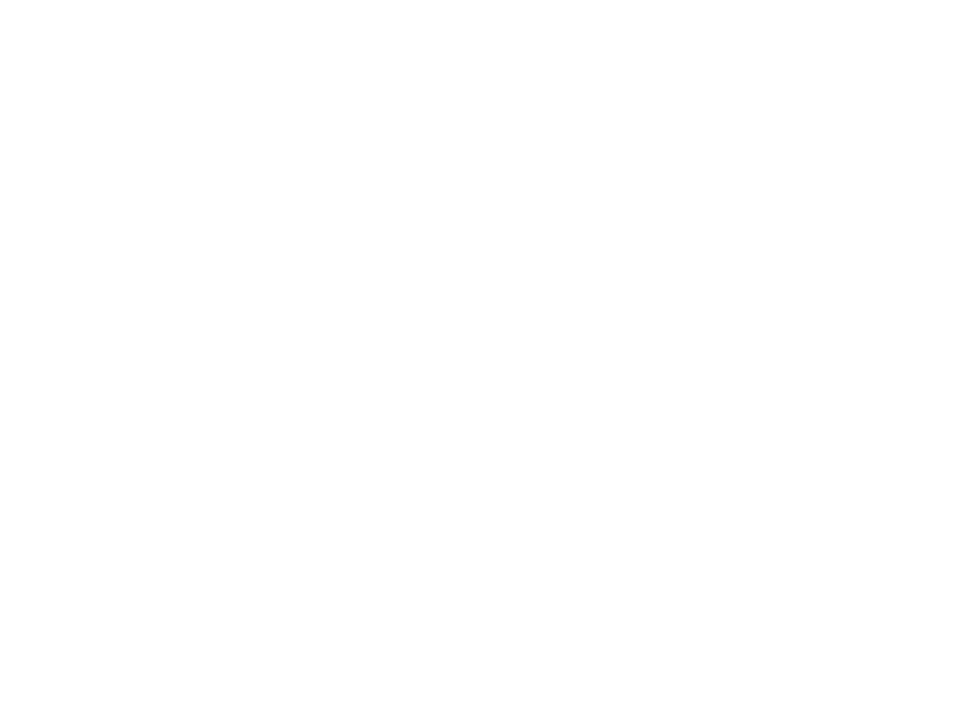

In [63]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_iodine_three ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


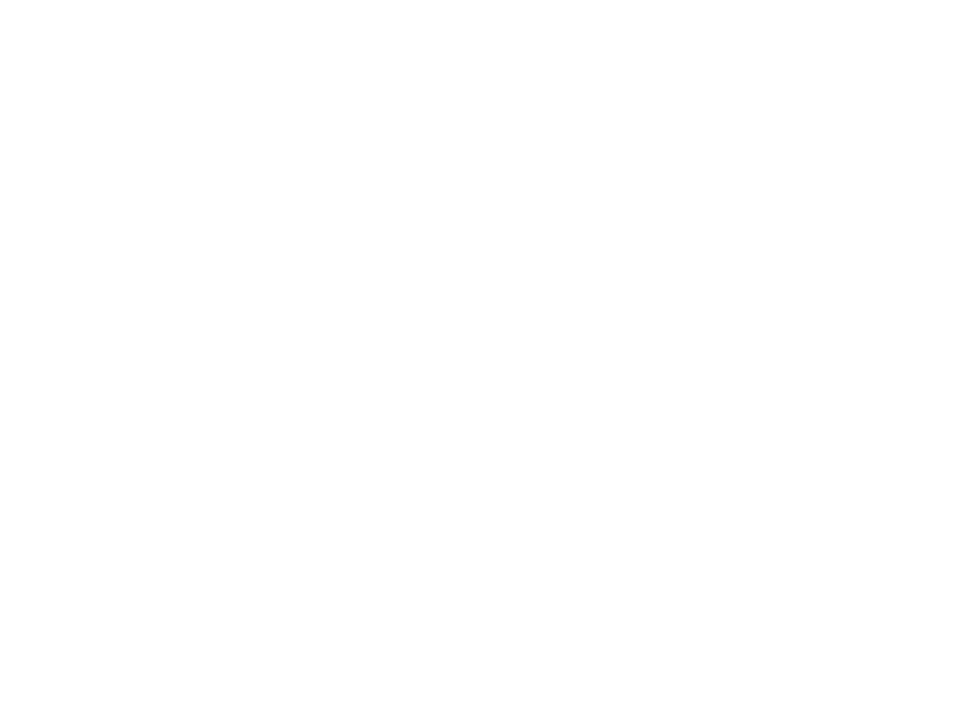

In [64]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_iodine_three ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


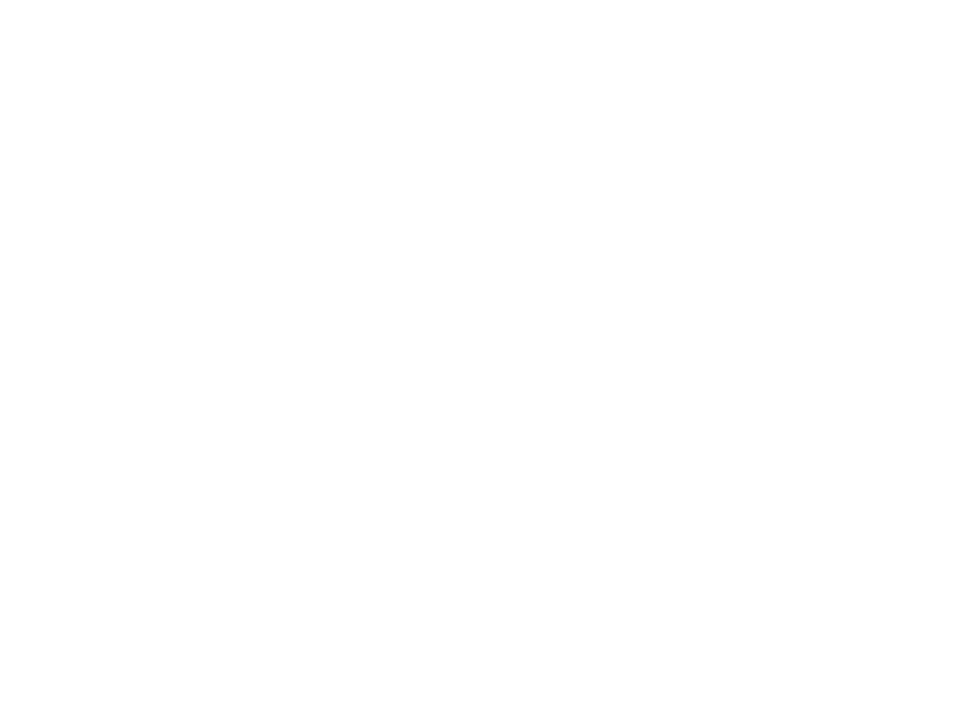

In [65]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_rna_three ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


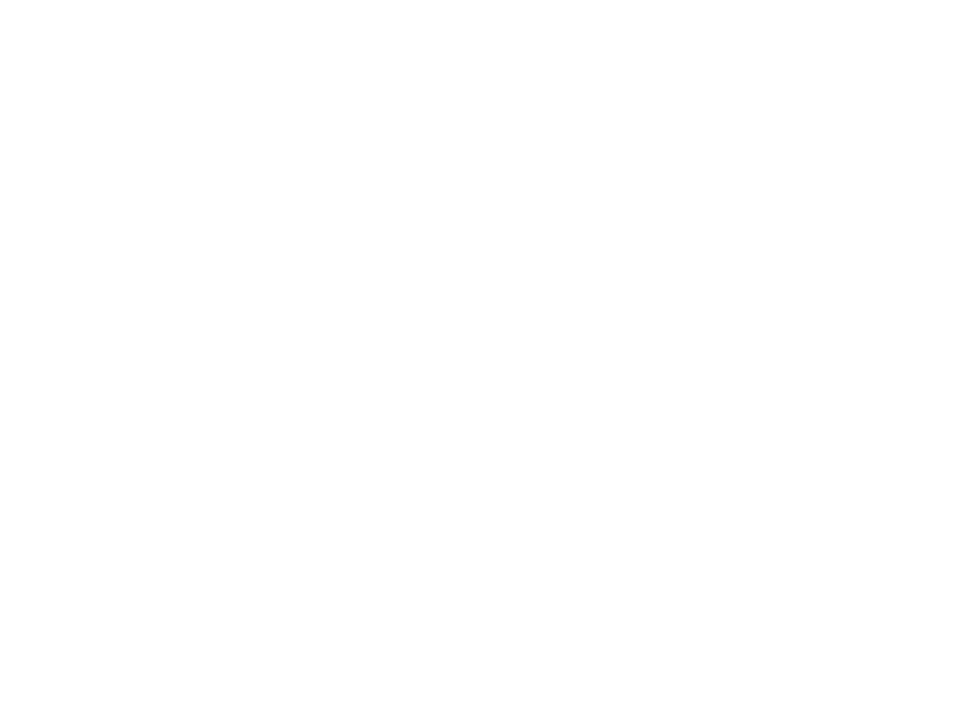

In [66]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_phos_three ,alpha= 0.51, cmap='cool',s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


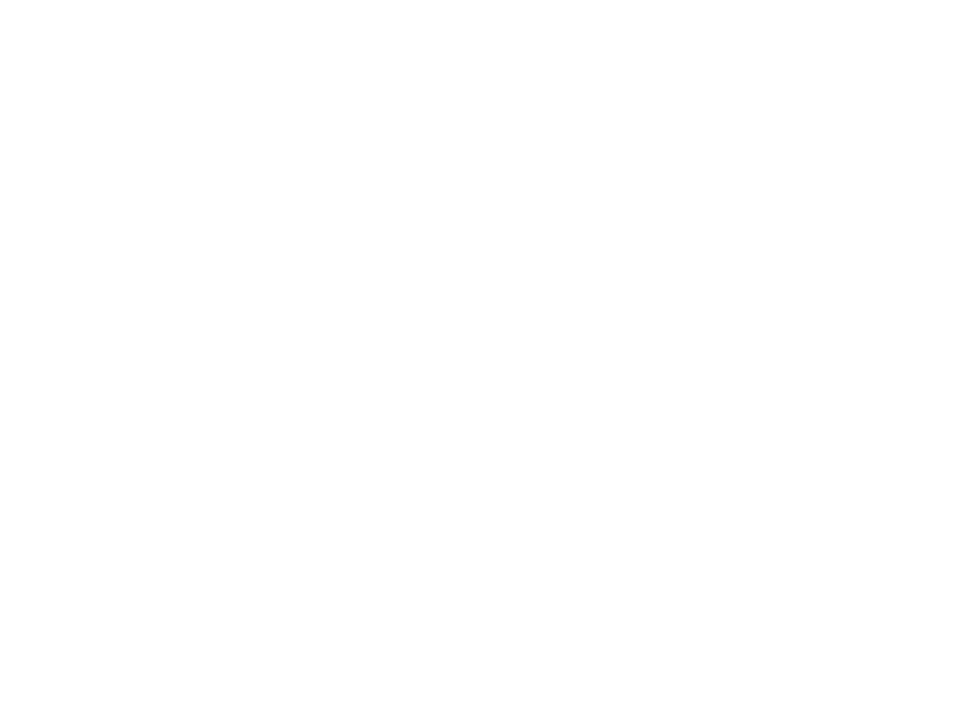

In [67]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_phos_four ,alpha= 1, cmap='cool',s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


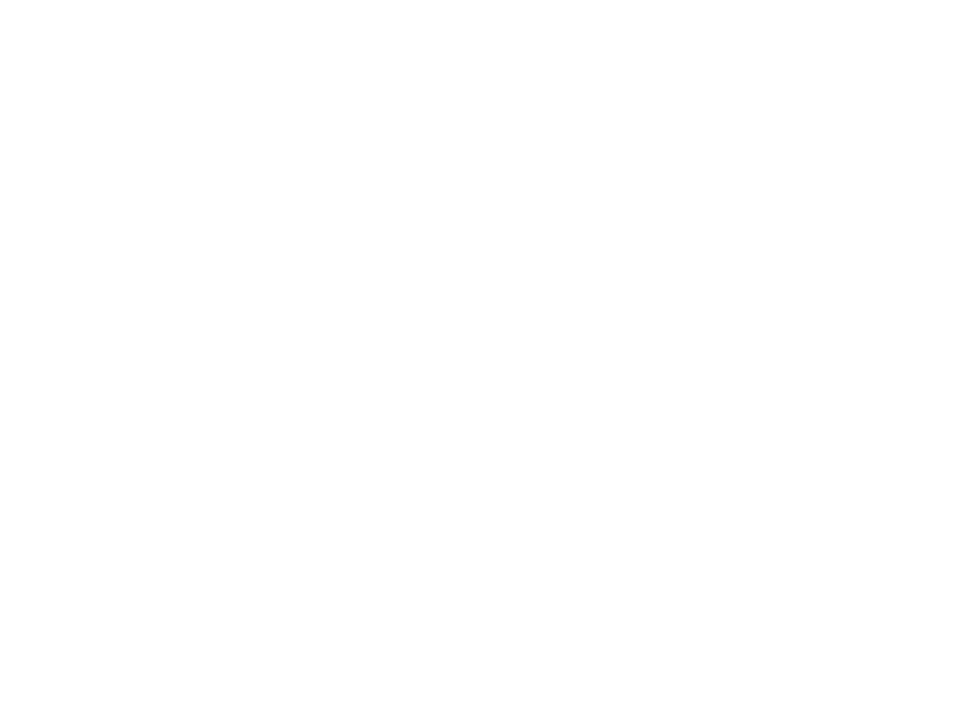

In [68]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_iodine_four ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


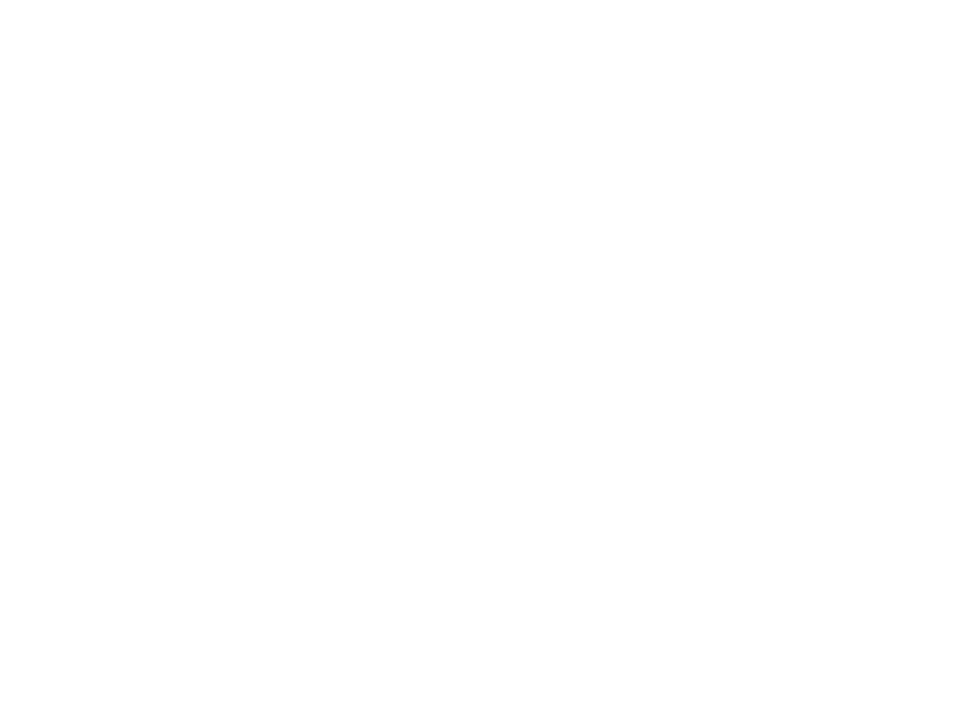

In [69]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_rna_four ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


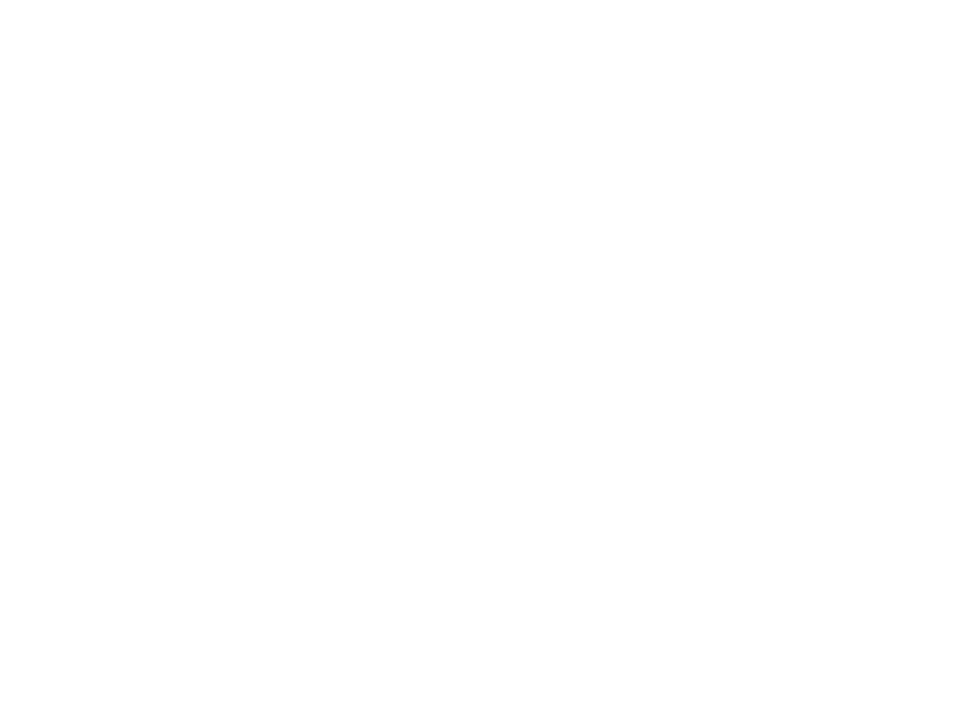

In [70]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],c = final_rna_five ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


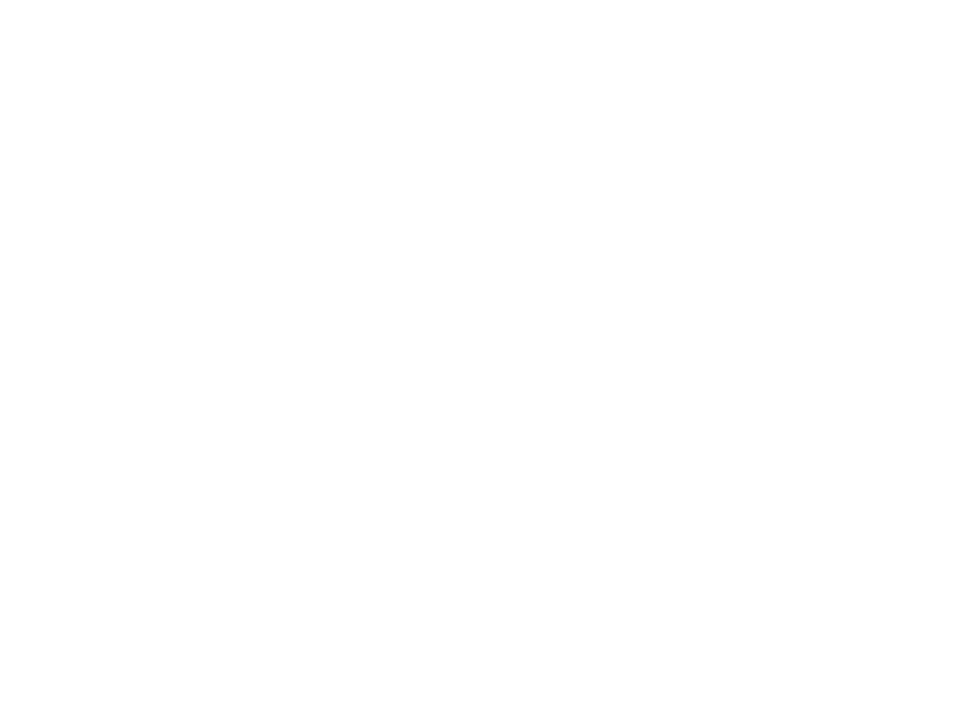

In [71]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],c = final_phos_five ,alpha= 0.51, cmap='cool',s = 0.9)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


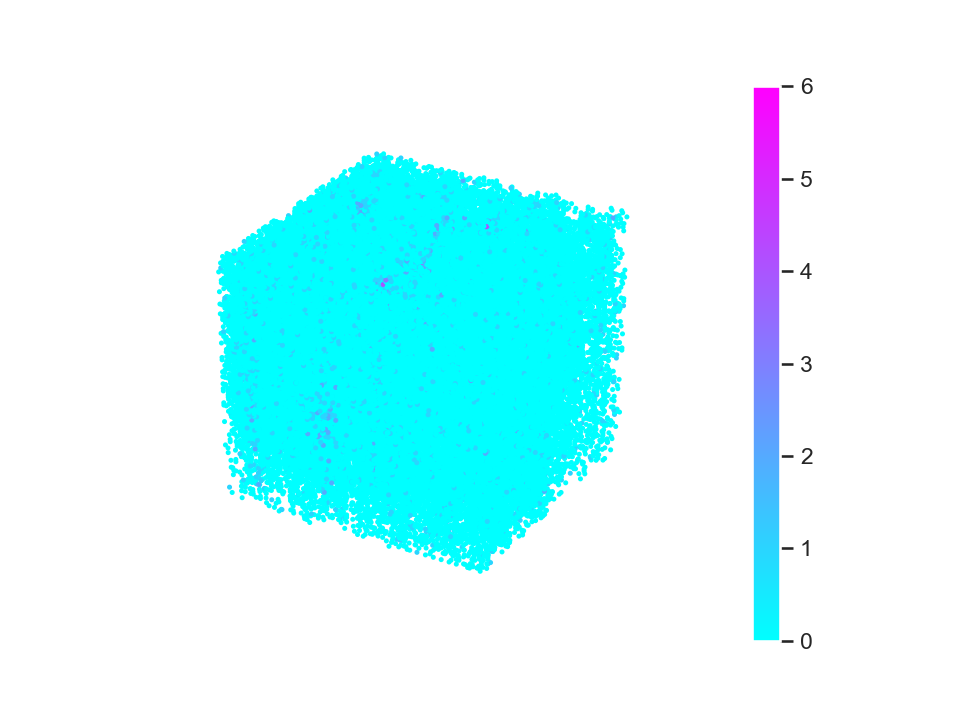

In [72]:
%matplotlib notebook
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],c = final_iodine_five ,alpha= 1, cmap='cool',s = 2)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


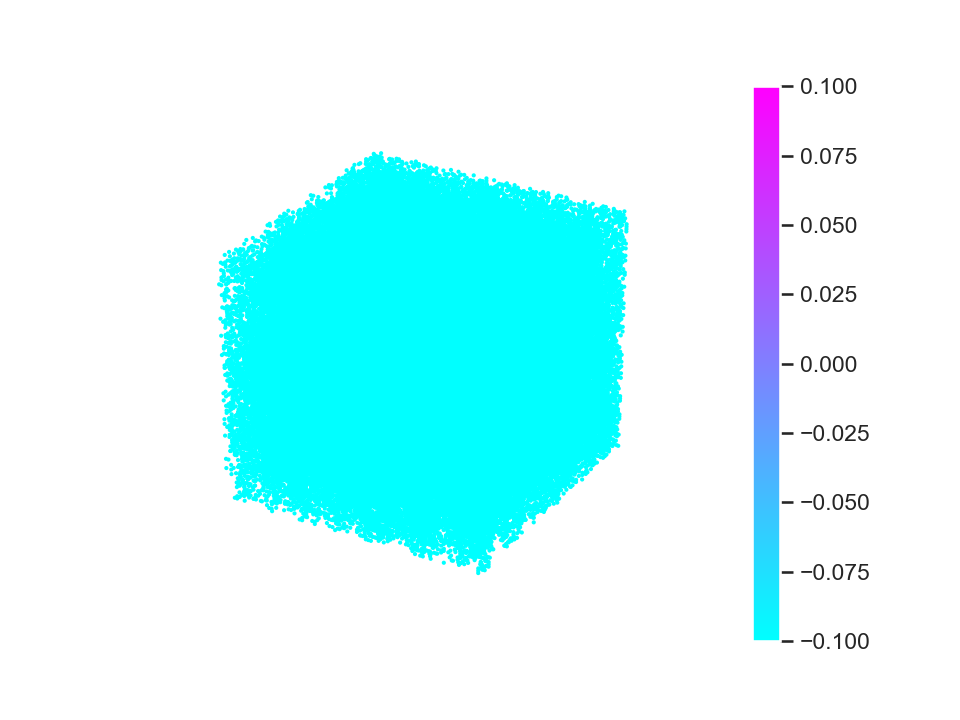

In [73]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_iodine_three ,alpha= 1, cmap="cool",s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


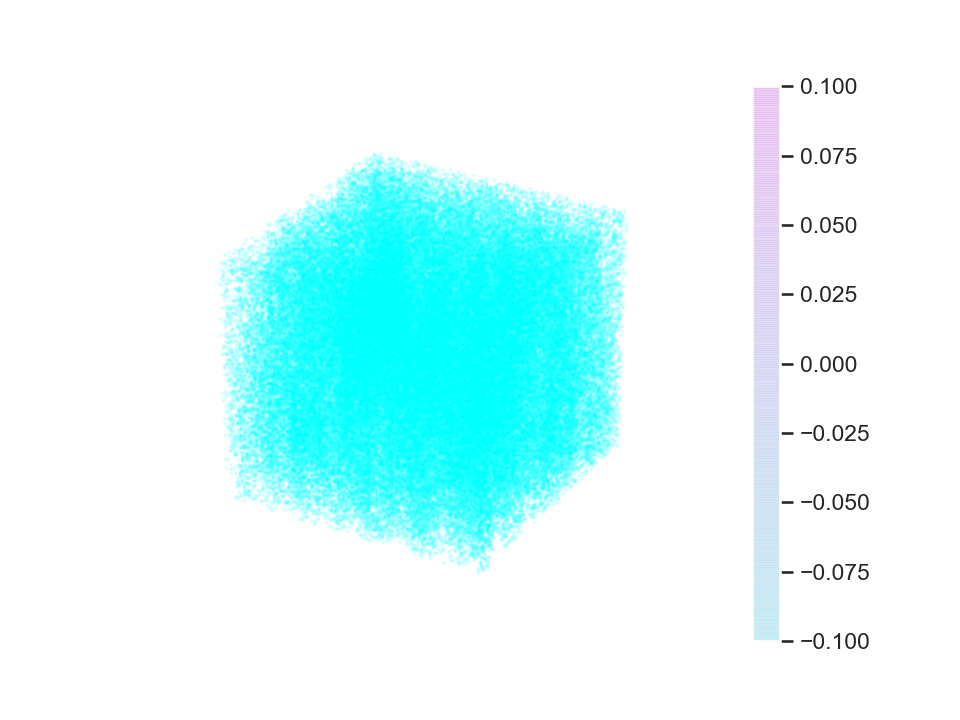

In [74]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_iodine_three ,alpha= 0.1, cmap="cool",s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


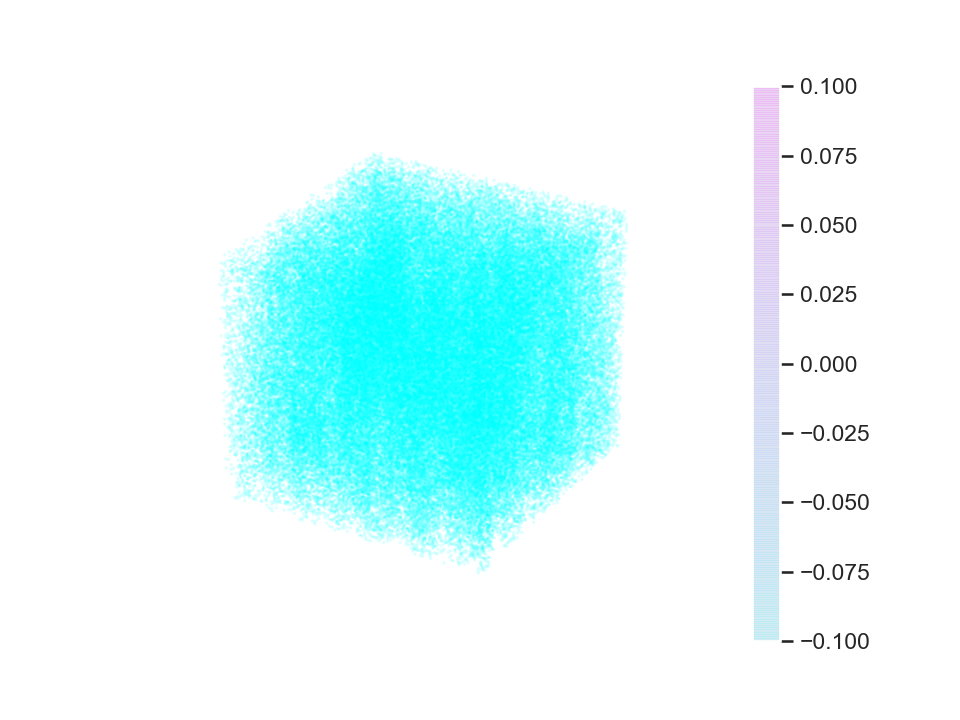

In [75]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_iodine_three ,alpha= 0.1, cmap="cool",s = 0.5)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


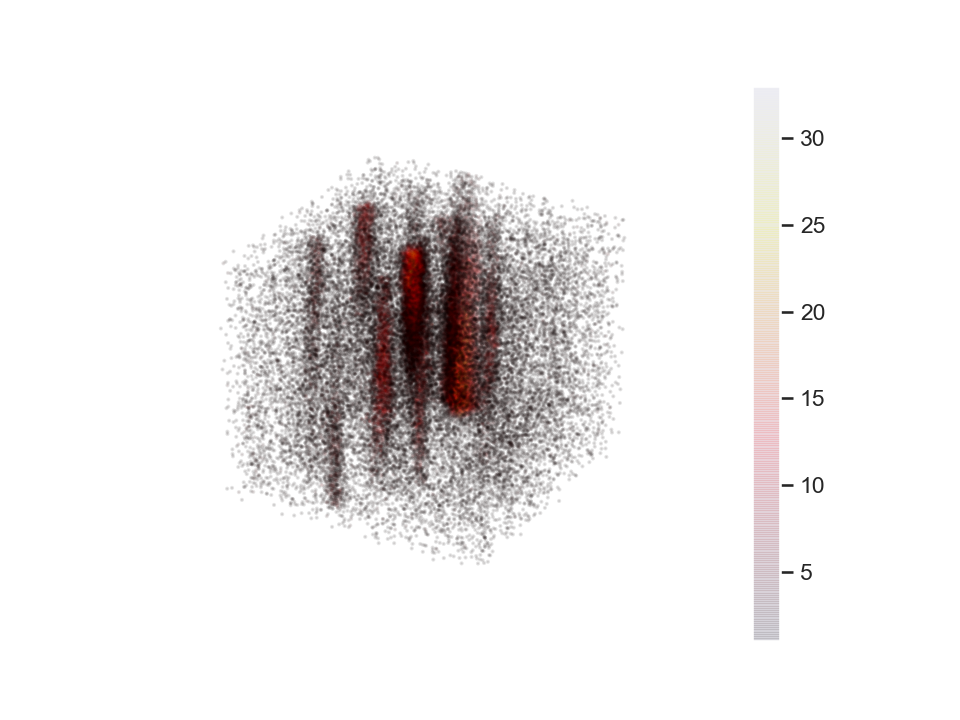

In [76]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_iodine_four ,alpha= 0.1, cmap=plt.hot(),s = 1)
#img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_rna_four ,alpha= 0.1, cmap=plt.cool(),s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


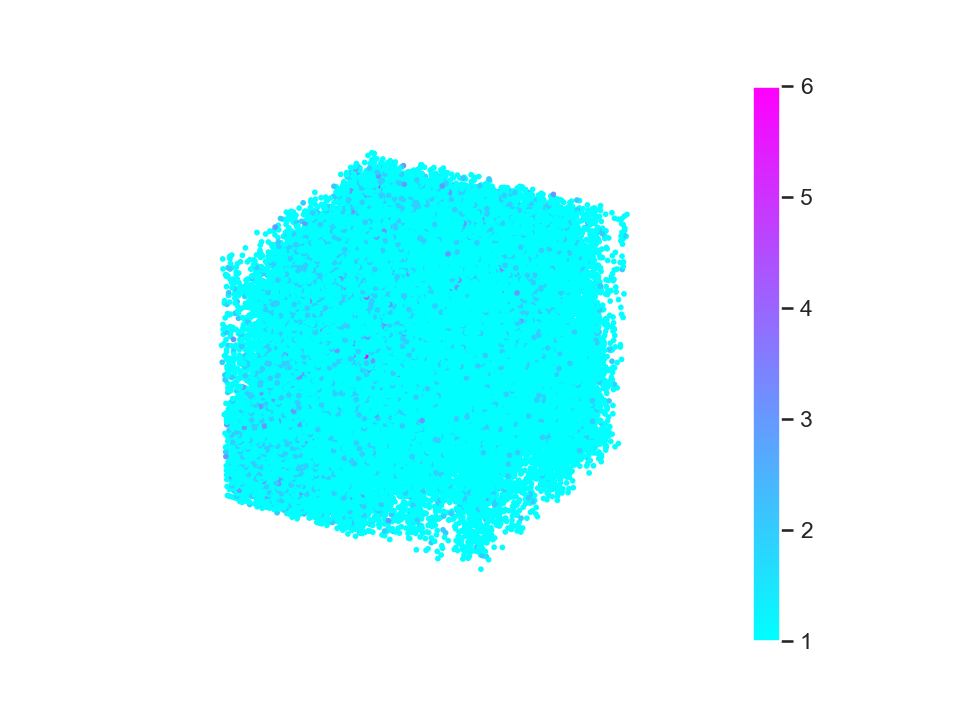

In [77]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],c = final_rna_two ,alpha= 1, cmap=plt.cool(),s = 3)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


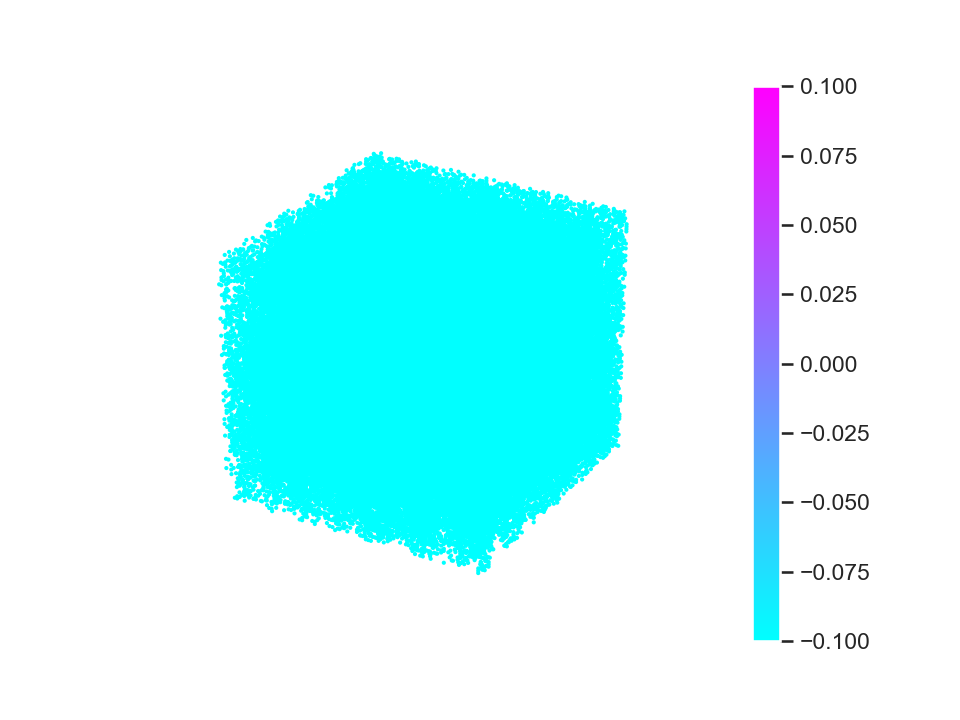

In [78]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_rna_three ,alpha= 1, cmap=plt.cool(),s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


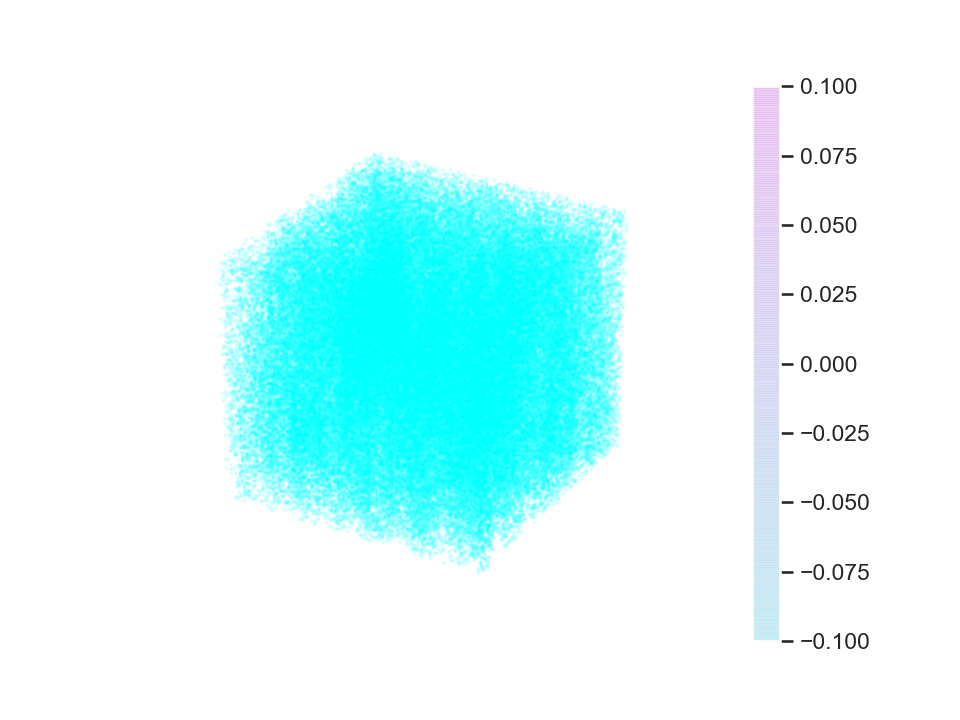

In [79]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_rna_three ,alpha= 0.1, cmap=plt.cool(),s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


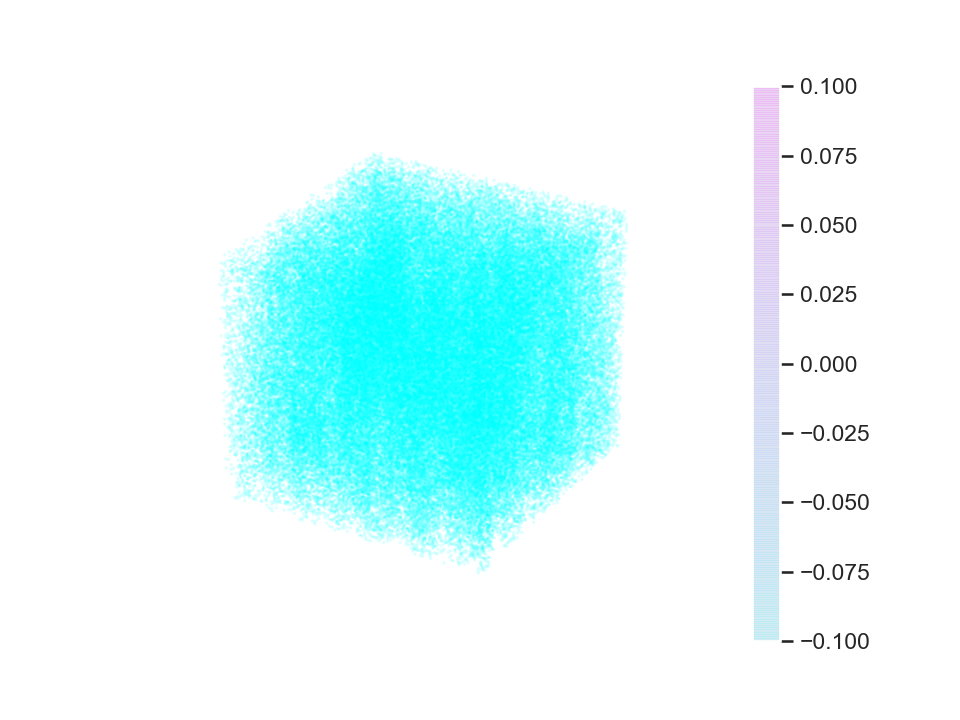

In [80]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_rna_three ,alpha= 0.1, cmap=plt.cool(),s = 0.5)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


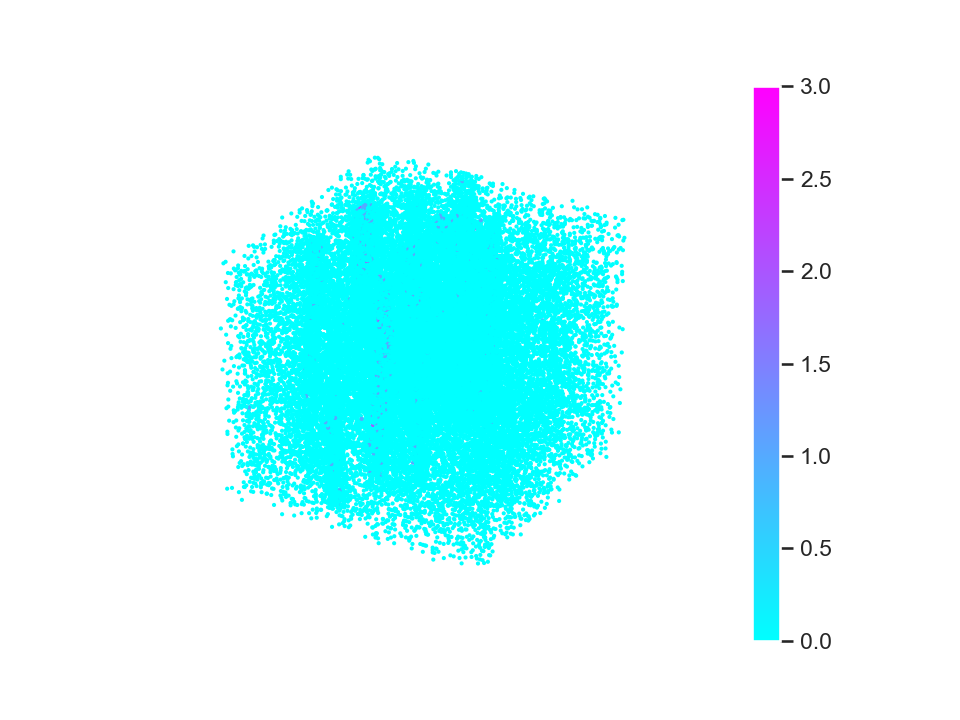

In [81]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_rna_four ,alpha= 1, cmap=plt.cool(),s = 1)


# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


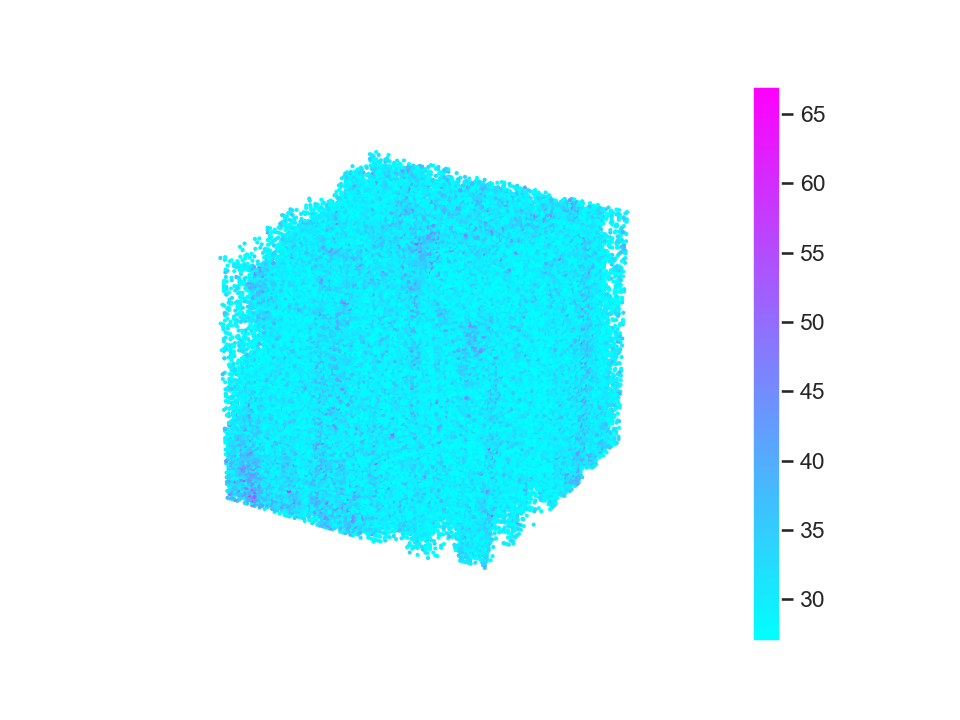

In [82]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],c = final_phos_zero ,alpha= 1, cmap=plt.cool(),s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


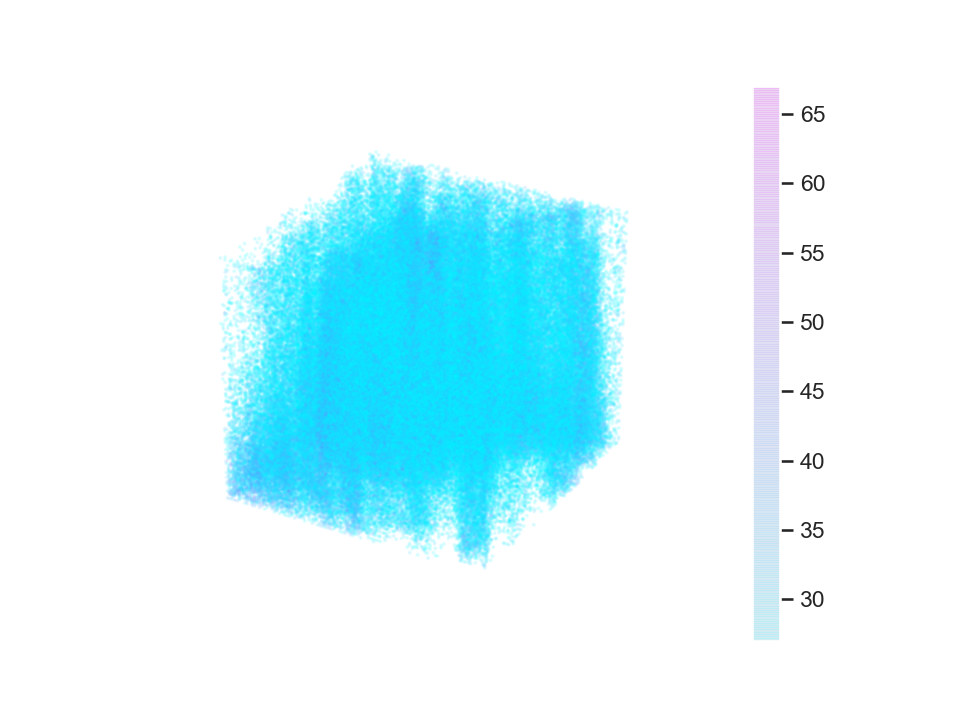

In [83]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],c = final_phos_zero ,alpha= 0.1, cmap=plt.cool(),s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


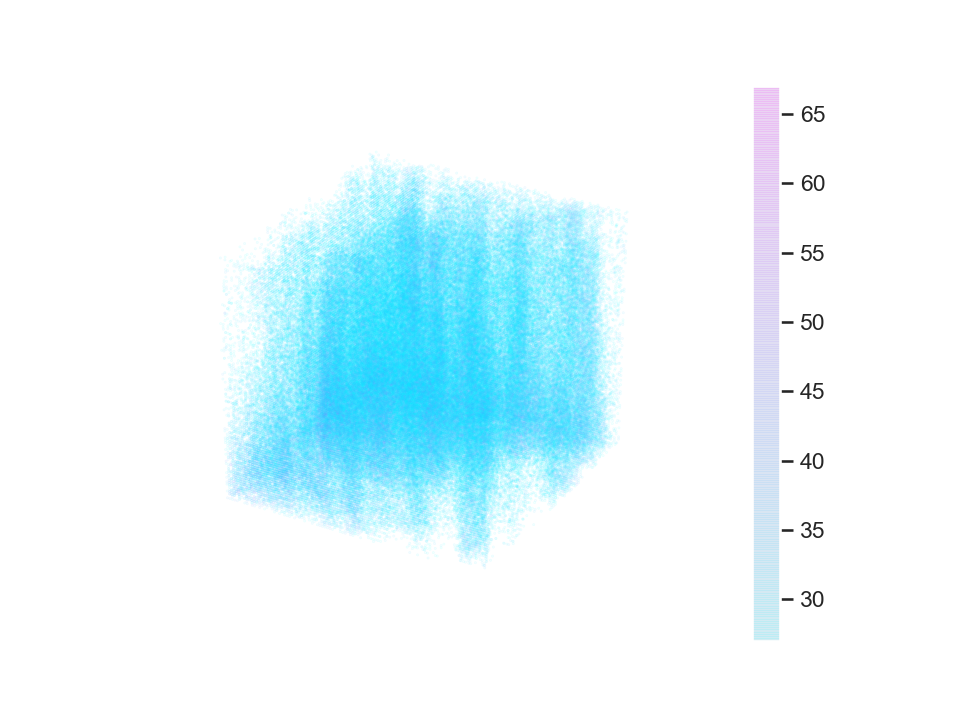

In [84]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],c = final_phos_zero ,alpha= 0.1, cmap=plt.cool(),s = 0.1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


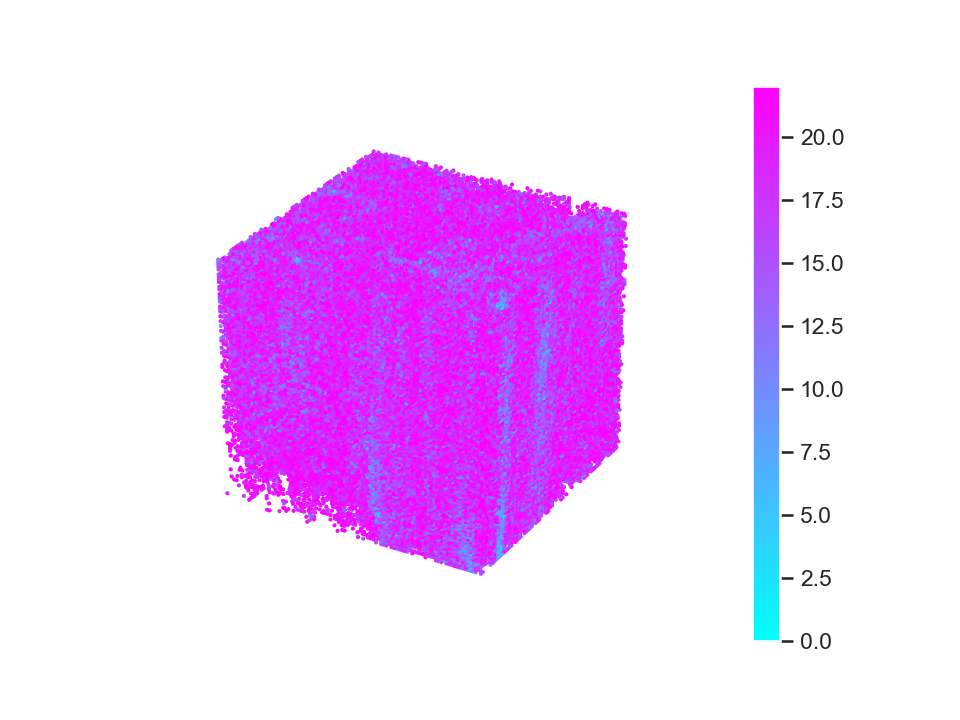

In [85]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

img = ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],c = final_phos_one ,alpha= 1, cmap=plt.cool(),s = 1)

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

In [86]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],c = final_phos_one ,alpha= 0.1, cmap=plt.cool(),s = 1)
# fig.colorbar(img)
# # First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])

# # First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [87]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],c = final_phos_one ,alpha= 0.1, cmap=plt.cool(),s = 0.1)
# fig.colorbar(img)
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [88]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],c = final_phos_two ,alpha= 1, cmap=plt.cool(),s = 1)
# # fig.colorbar(img)
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [89]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],c = final_phos_two ,alpha= 0.1, cmap=plt.cool(),s = 3)
# fig.colorbar(img)
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [90]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_phos_three ,alpha= 1, cmap=plt.cool(),s = 1)
# fig.colorbar(img)
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [91]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_phos_three ,alpha= 0.1, cmap=plt.cool(),s = 1)
# fig.colorbar(img)
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [92]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],c = final_phos_three ,alpha= 0.1, cmap=plt.cool(),s = 0.1)
# fig.colorbar(img)
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [93]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_phos_four ,alpha= 1, cmap=plt.cool(),s = 1)
# fig.colorbar(img)
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [94]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_phos_four ,alpha= 0.1, cmap=plt.cool(),s = 1)
# fig.colorbar(img)
# First remove fill
# First remove fill
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [95]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],c = final_phos_four ,alpha= 0.1, cmap=plt.cool(),s = 0.1)
# fig.colorbar(img)
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [96]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],c = final_phos_five ,alpha= 1, cmap=plt.cool(),s = 1)
# fig.colorbar(img)
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [97]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],c = final_phos_five ,alpha= 0.1, cmap=plt.cool(),s = 1)
# fig.colorbar(img)
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

In [98]:
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

# img = ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],c = final_phos_five ,alpha= 1, cmap=plt.cool(),s = 0.1)
# fig.colorbar(img)
# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
# plt.show()

## PLotting Clusters + different biomarkers (Better graphs)

<IPython.core.display.Javascript object>


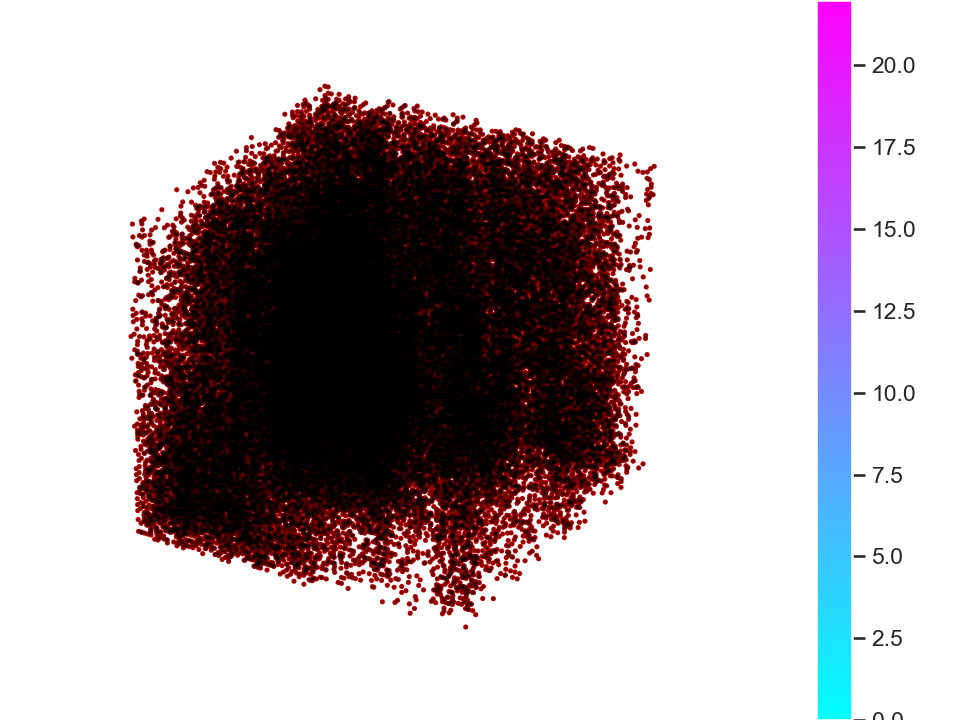

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\mpl_toolkits\mplot3d\art3d.py:794: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if zdir == 'x':
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\mpl_toolkits\mplot3d\art3d.py:796: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  elif zdir == 'y':


In [99]:
fig = plt.figure()
ax = Axes3D(fig) 
#ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "orange", alpha = 0.3)
#ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.01)
ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],final_iodine_two,s = 2,color = "red", alpha = 1)
#ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 2,color = "black", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 2,color = "pink", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
#ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
#ax.set_xlim3d(100,150)  
ax.scatter3D(wow_p2[:,0],wow_p2[:,1],wow_p2[:,2],s = 2,color = "black", alpha = 0.3)
#ax.scatter3D(wow2[:,0],wow2[:,1],wow2[:,2],s = 4,color = "yellow", alpha = 0.1)
#ax.scatter3D(wow3[:,0],wow3[:,1],wow3[:,2],s = 5,color = "pink", alpha = 0.1)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


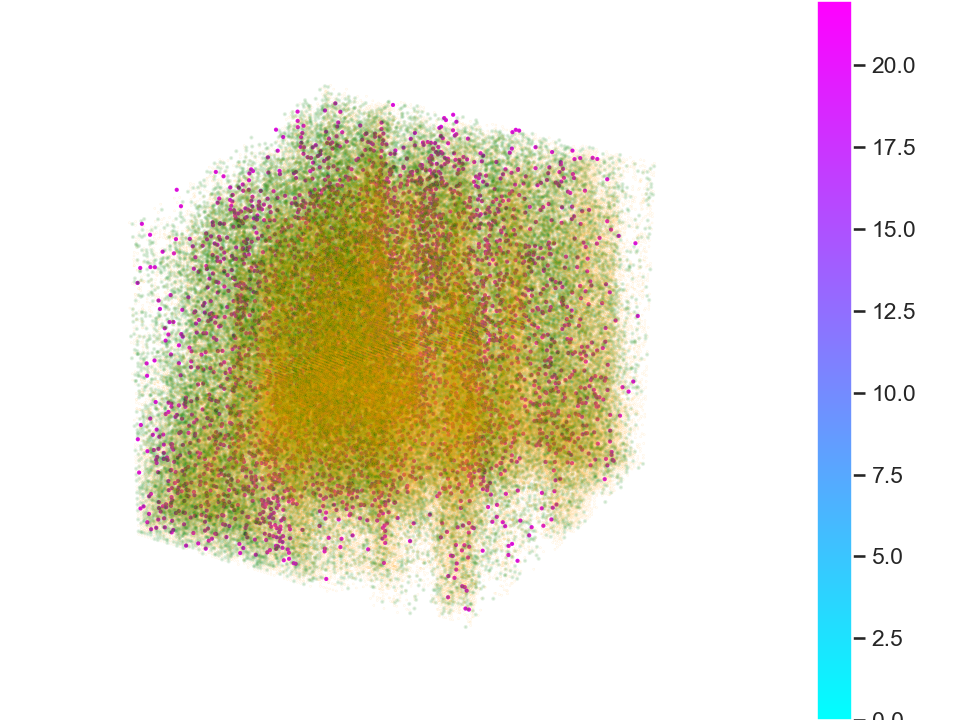

In [100]:
fig = plt.figure()
ax = Axes3D(fig) 
#ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 0.01,color = "orange", alpha = 0.3)
#ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.01)
#ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],final_iodine_two,s = 2,color = "red", alpha = 1)
#ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 2,color = "black", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 2,color = "pink", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
#ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
#ax.set_xlim3d(100,150)  
ax.scatter3D(wow_r2[:,0],wow_r2[:,1],wow_r2[:,2],s = 1,color = "green", alpha = 0.11)
ax.scatter3D(wow_i2[:,0],wow_i2[:,1],wow_i2[:,2],s = 1,color = "magenta", alpha = 1)
#ax.scatter3D(wow2[:,0],wow2[:,1],wow2[:,2],s = 4,color = "yellow", alpha = 0.1)
#ax.scatter3D(wow3[:,0],wow3[:,1],wow3[:,2],s = 5,color = "pink", alpha = 0.1)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


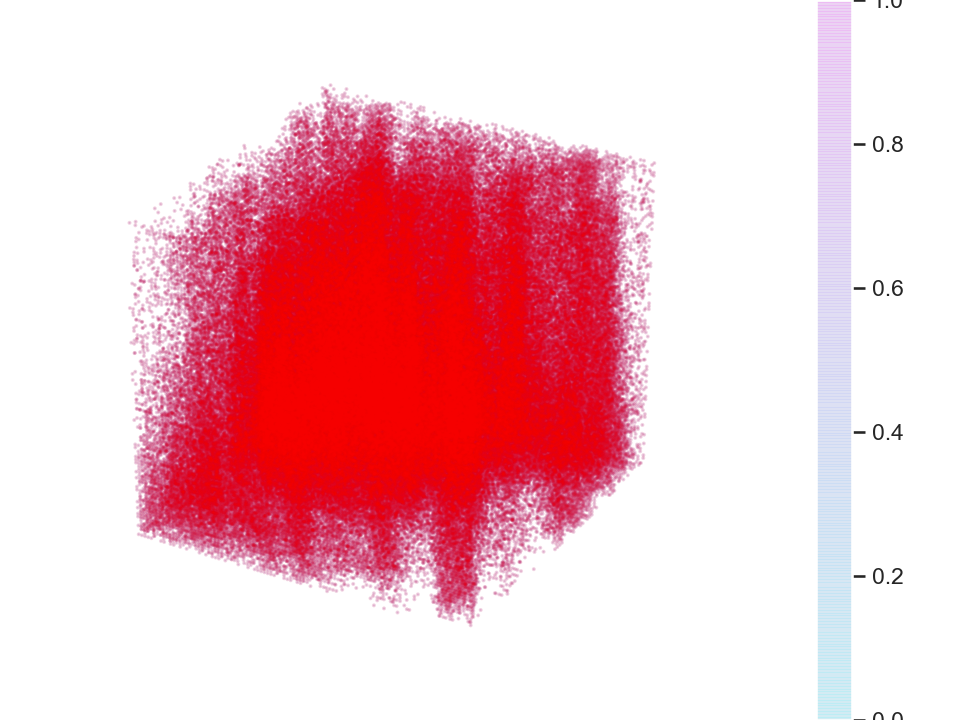

In [101]:
fig = plt.figure()
ax = Axes3D(fig) 
# #ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 0.6,color = "blue", alpha = 0.08)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],c = final_rna_zero ,alpha= 0.1, cmap='cool',s = 0.5)
#ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.01)
#ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],s = 2,color = "red", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 2,color = "black", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 2,color = "pink", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
#ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
#ax.set_xlim3d(100,150)  
img = ax.scatter3D(wow_p0[:,0],wow_p0[:,1],wow_p0[:,2],cmap = phos_value,s = 1,c = 'red', alpha = 0.1)
#img = ax.scatter3D(wow_r0[:,0],wow_r0[:,1],wow_r0[:,2],cmap = rna_value,s = 1,color = "red", alpha = 1)
#img = ax.scatter3D(wow_i0[:,0],wow_i0[:,1],wow_i0[:,2],cmap = iod_value,s = 2,color = "red", alpha = 1)
#fig.colorbar(img)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()


<IPython.core.display.Javascript object>


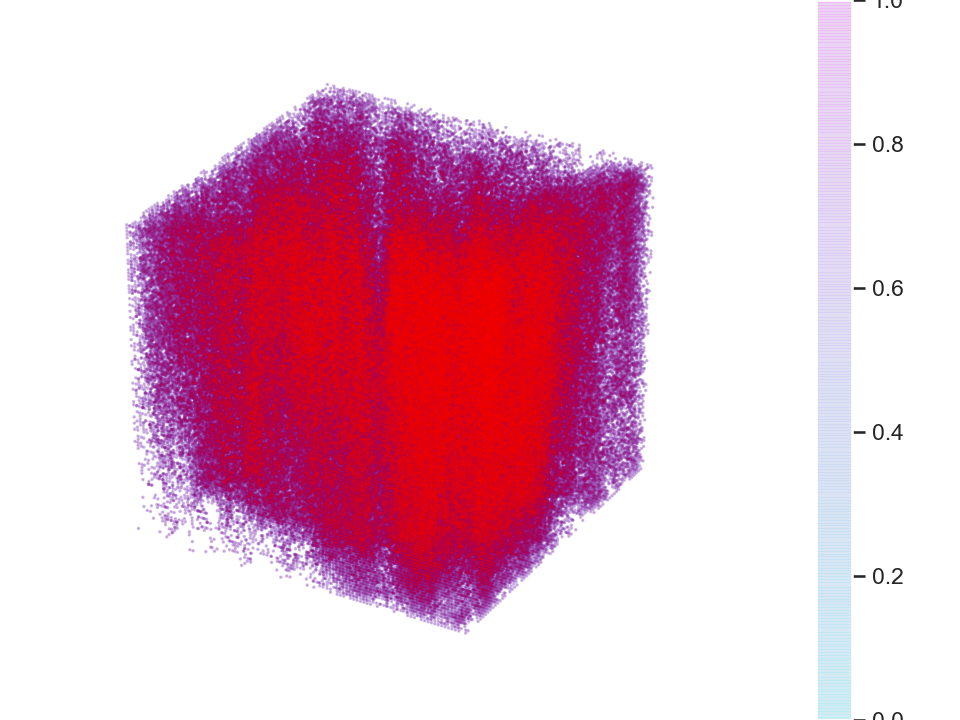

In [102]:
fig = plt.figure()
ax = Axes3D(fig) 
#ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "orange", alpha = 0.3)
ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 0.4,color = "blue", alpha = 0.2)
#ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],s = 2,color = "red", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 2,color = "black", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 2,color = "pink", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
#ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
#ax.set_xlim3d(100,150)  
img = ax.scatter3D(wow_p1[:,0],wow_p1[:,1],wow_p1[:,2],cmap = phos_value,s = 0.4,color = "red", alpha = 0.1)
#img = ax.scatter3D(wow_r1[:,0],wow_r1[:,1],wow_r1[:,2],cmap = rna_value,s = 0.8,color = "red", alpha = 0.5)
#img = ax.scatter3D(wow_i1[:,0],wow_i1[:,1],wow_i1[:,2],cmap = iod_value,s = 1,color = "red", alpha = 1)
# fig.colorbar(img)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()


<IPython.core.display.Javascript object>


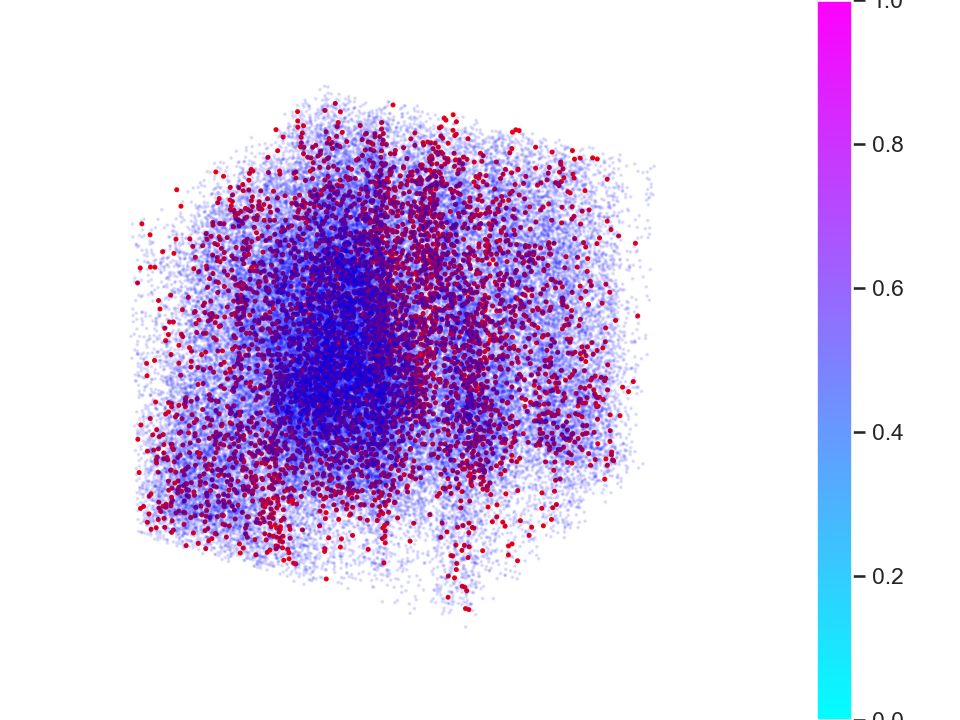

In [103]:
fig = plt.figure()
ax = Axes3D(fig) 
#ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "orange", alpha = 0.3)
#ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.01)
ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],s = 0.7,color = "blue", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 2,color = "black", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 2,color = "pink", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
#ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
#ax.set_xlim3d(100,150)  
#img = ax.scatter3D(wow_p2[:,0],wow_p2[:,1],wow_p2[:,2],cmap = phos_value,s = 0.8,color = "red", alpha = 0.3)
#img = ax.scatter3D(wow_r2[:,0],wow_r2[:,1],wow_r2[:,2],cmap = rna_value,s = 0.8,color = "red", alpha = 0.3)
img = ax.scatter3D(wow_i2[:,0],wow_i2[:,1],wow_i2[:,2],cmap = iod_value,s = 2,color = "red", alpha = 1)
#fig.colorbar(img)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

<IPython.core.display.Javascript object>


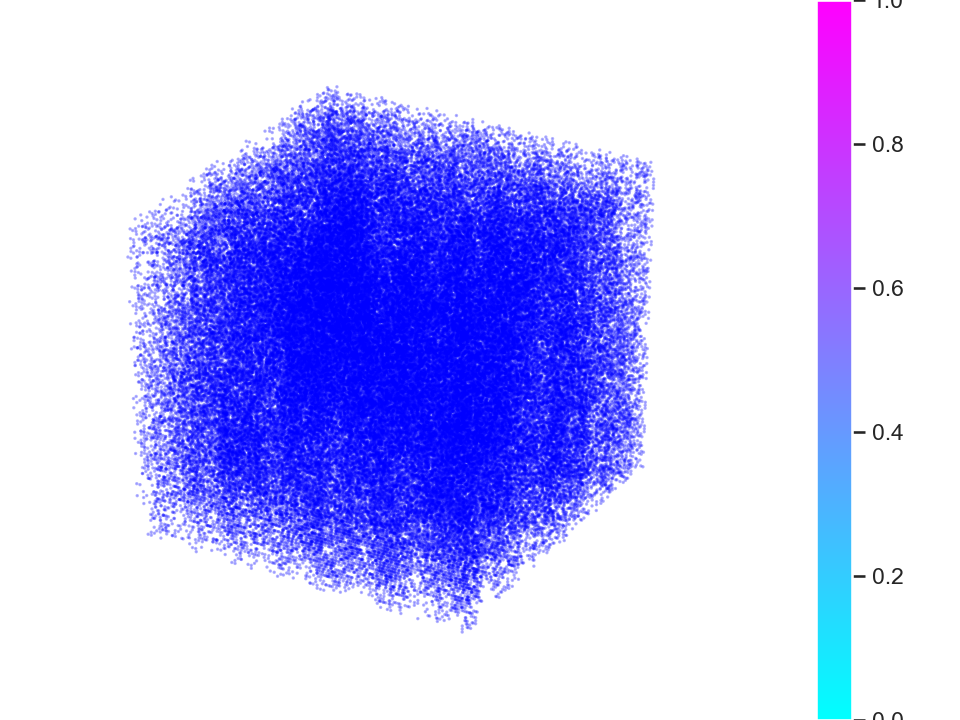

In [104]:
fig = plt.figure()
ax = Axes3D(fig) 
#ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "orange", alpha = 0.3)
#ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.01)
#ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],s = 2,color = "red", alpha = 0.1)
ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 0.4,color = "blue", alpha = 0.3)
#ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 2,color = "pink", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
#ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
#ax.set_xlim3d(100,150)  
#img = ax.scatter3D(wow_p3[:,0],wow_p3[:,1],wow_p3[:,2],cmap = phos_value,s = 0.3,color = "red", alpha = 0.3)
#img = ax.scatter3D(wow_r3[:,0],wow_r3[:,1],wow_r3[:,2],cmap = rna_value,s = 0.8,color = "red", alpha = 0.5)
#img = ax.scatter3D(wow_i3[:,0],wow_i3[:,1],wow_i3[:,2],cmap = iod_value,s = 0.8,color = "red", alpha = 0.5)
#fig.colorbar(img)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


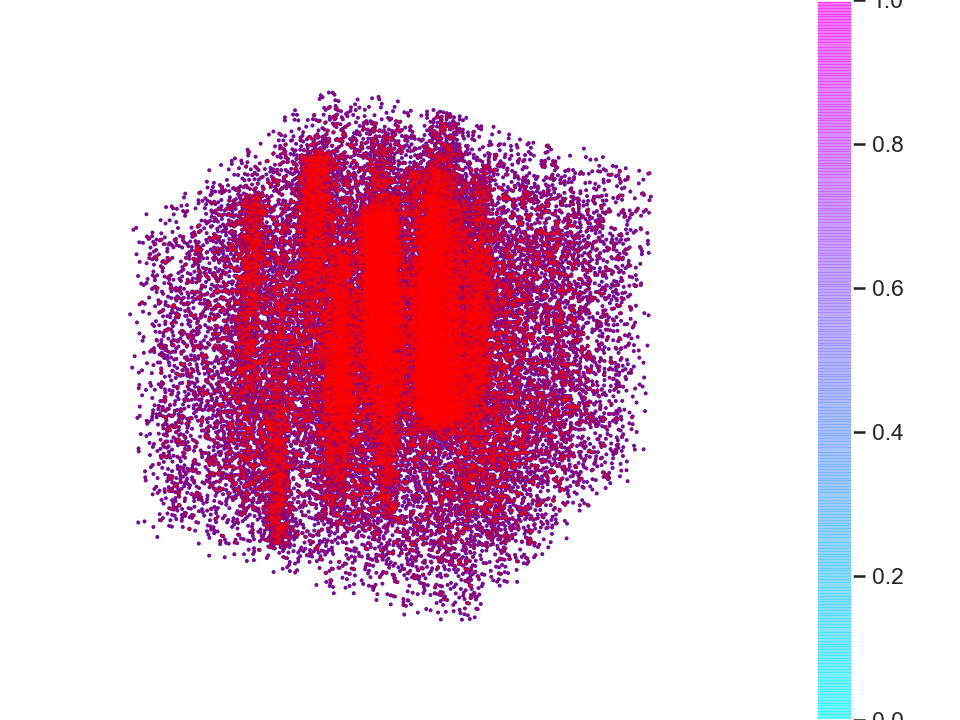

In [105]:
fig = plt.figure()
ax = Axes3D(fig) 
#ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "orange", alpha = 0.3)
#ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.01)
#ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],s = 2,color = "red", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 2,color = "black", alpha = 0.1)
ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 0.8,color = "blue", alpha = 0.9)
#ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
#ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
#ax.set_xlim3d(100,150)  
#img = ax.scatter3D(wow_p4[:,0],wow_p4[:,1],wow_p4[:,2],cmap = phos_value,s = 0.4,color = "red", alpha = 0.4)
#img = ax.scatter3D(wow_r4[:,0],wow_r4[:,1],wow_r4[:,2],cmap = rna_value,s = 2,color = "red", alpha = 1)
img = ax.scatter3D(wow_i4[:,0],wow_i4[:,1],wow_i4[:,2],cmap = iod_value,s = 0.4,color = "red", alpha = 0.5)
#fig.colorbar(img)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


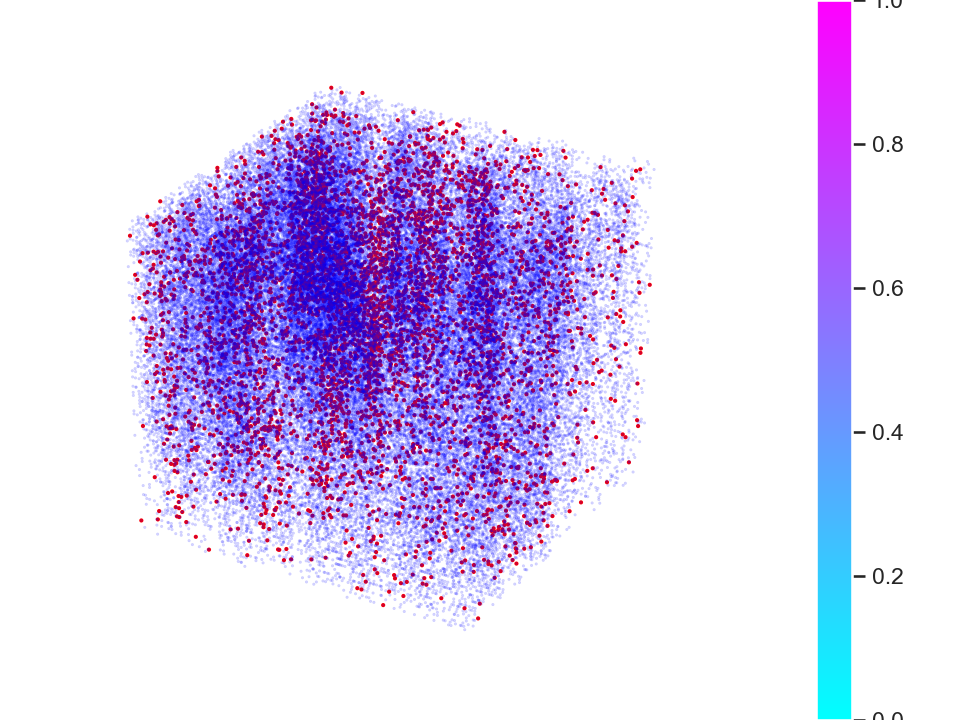

In [106]:
fig = plt.figure()
ax = Axes3D(fig) 
#ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "orange", alpha = 0.3)
#ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.01)
#ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],s = 2,color = "red", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 2,color = "black", alpha = 0.1)
#ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 2,color = "pink", alpha = 0.1)
ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 0.2,color = "blue", alpha = 0.2)
#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(6,8)                    # viewrange for z-axis should be [-4,4] 
ax.set_ylim3d(100,150)                    # viewrange for y-axis should be [-2,2] 
ax.set_xlim3d(100,150)  
#img = ax.scatter3D(wow_p5[:,0],wow_p5[:,1],wow_p5[:,2],cmap = phos_value,s = 0.4,color = "red", alpha = 0.2)
#img = ax.scatter3D(wow_r5[:,0],wow_r5[:,1],wow_r5[:,2],cmap = rna_value,s = 0.4,color = "red", alpha = 0.2)
img = ax.scatter3D(wow_i5[:,0],wow_i5[:,1],wow_i5[:,2],cmap = iod_value,s = 1,color = "red", alpha = 1)
# fig.colorbar(img)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])
plt.show()

## Plotting 3D surf plots

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


<IPython.core.display.Javascript object>


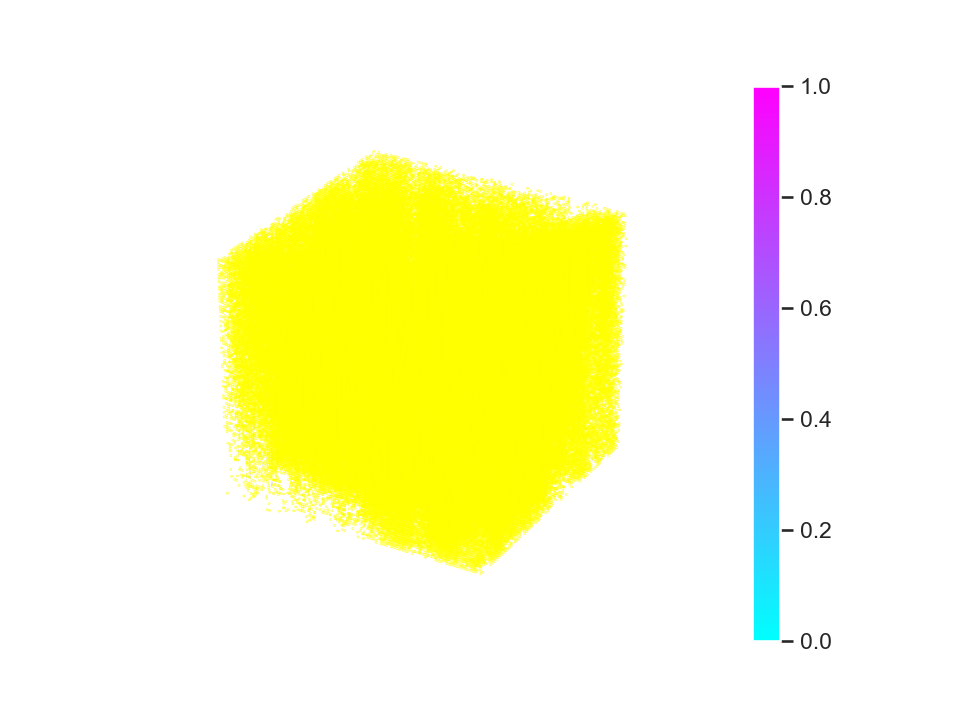

In [107]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
from sys import argv
# Plot X,Y,Z
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_trisurf([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],alpha = 0.09)
ax.scatter([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices], c='yellow',s =  0.05, alpha = 1)
# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

fig.colorbar(img)
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])
frame1.axes.get_zaxis().set_ticks([])
ax.set_ylim(ax.get_ylim()[::-1])
ax.set_xlim(ax.get_xlim()[::-1])

plt.show()

## Plotting all the clusters, with axis limits

In [108]:
# fig = plt.figure()
# ax = Axes3D(fig) 
# ax.scatter3D(x_list,y_list,z_list, c = kmeans_list,s= 2, alpha = 0.1)
# ax.set_zlim3d(1,3)                    # viewrange for z-axis should be [-4,4] 
# ax.set_ylim3d(50,200)                    # viewrange for y-axis should be [-2,2] 
# ax.set_xlim3d(100,200)  
# plt.show

## Plotting the correlation Maps

In [109]:
final_rna_two = np.array(final_rna_two)
final_phos_zero = np.array(final_phos_zero)    
final_phos_one = np.array(final_phos_one)    
final_phos_two = np.array(final_phos_two)    
final_phos_three = np.array(final_phos_three)    
final_phos_four = np.array(final_phos_four)    
final_phos_five = np.array(final_phos_five)   

In [110]:
final_iodine_zero[final_iodine_zero>0] = 1
final_iodine_one[final_iodine_one>0] = 1   
final_iodine_two[final_iodine_two>0] = 1   
final_iodine_three[final_iodine_three>0] = 1   
final_iodine_four[final_iodine_four>0] = 1   
final_iodine_five[final_iodine_five>0] = 1   

final_rna_zero[final_rna_zero>0] = 1   
final_rna_one[final_rna_one>0] = 1   
final_rna_two[final_rna_two>0] = 1   
final_rna_three[final_rna_three>0] = 1   
final_rna_four[final_rna_four>0] = 1   
final_rna_five[final_rna_five>0] = 1   


final_phos_zero[final_phos_zero>0] = 1   
final_phos_one[final_phos_one>0] = 1   
final_phos_two[final_phos_two>0] = 1   
final_phos_three[final_phos_three>0] = 1   
final_phos_four[final_phos_four>0] = 1   
final_phos_five[final_phos_five>0] = 1

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


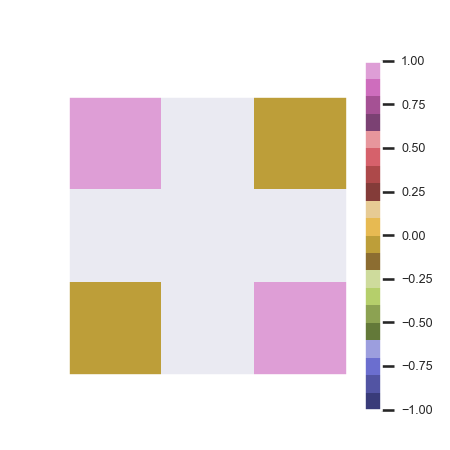

In [111]:
data0 = pd.DataFrame(({'I':final_iodine_zero,'P':final_phos_zero,'R':final_rna_zero}))
data1 = pd.DataFrame(({'I':final_iodine_one,'P':final_phos_one,'R':final_rna_one}))
data2 = pd.DataFrame(({'I':final_iodine_two,'P':final_phos_two,'R':final_rna_two}))
data3 = pd.DataFrame(({'I':final_iodine_three,'P':final_phos_three,'R':final_rna_three}))
data4 = pd.DataFrame(({'I':final_iodine_four,'P':final_phos_four,'R':final_rna_four}))
data5 = pd.DataFrame(({'I':final_iodine_five,'P':final_phos_five,'R':final_rna_five}))
data6 = pd.DataFrame(({'I':heat_map_iod,'P':heat_map_phos,'R':heat_map_rna}))
# data6 = pd.DataFrame(({'I':np.log(iodine),'P':np.log(phosphorous),'R':np.log(rna)}))

f = plt.figure(figsize=(3, 3))
plt.matshow(data0.corr(), fignum=f.number,vmin = -1,vmax = 1,cmap = "tab20b")
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])

#plt.xticks(range(data.shape[1]), data.columns, fontsize=14, rotation=45)
# plt.yticks(range(data.shape[1]), data.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=6)
#plt.title('CLuster 0', fontsize=10);

In [112]:
final_iodine_zero_normalized = (final_iodine_zero-np.min(final_iodine_zero))/np.ptp(final_iodine_zero)
final_iodine_one_normalized = (final_iodine_one-np.min(final_iodine_one))/np.ptp(final_iodine_one)
final_iodine_two_normalized = (final_iodine_two-np.min(final_iodine_two))/np.ptp(final_iodine_two)
final_iodine_three_normalized = (final_iodine_three-np.min(final_iodine_three))/np.ptp(final_iodine_three)
final_iodine_four_normalized = (final_iodine_four-np.min(final_iodine_four))/np.ptp(final_iodine_four)
final_iodine_five_normalized = (final_iodine_five-np.min(final_iodine_five))/np.ptp(final_iodine_five)
final_rna_zero_normalized = (final_rna_zero-np.min(final_rna_zero))/np.ptp(final_rna_zero)
final_rna_one_normalized = (final_rna_one-np.min(final_rna_one))/np.ptp(final_rna_one)
final_rna_two_normalized = (final_rna_two-np.min(final_rna_two))/np.ptp(final_rna_two)
final_rna_three_normalized = (final_rna_three-np.min(final_rna_three))/np.ptp(final_rna_three)
final_rna_four_normalized = (final_rna_four-np.min(final_rna_four))/np.ptp(final_rna_four)
final_rna_five_normalized = (final_rna_five-np.min(final_rna_five))/np.ptp(final_rna_five)

final_phos_zero_normalized = (final_phos_zero-np.min(final_phos_zero))/np.ptp(final_phos_zero)
final_phos_one_normalized = (final_phos_one-np.min(final_phos_one))/np.ptp(final_phos_one)
final_phos_two_normalized = (final_phos_two-np.min(final_phos_two))/np.ptp(final_phos_two)
final_phos_three_normalized = (final_phos_three-np.min(final_phos_three))/np.ptp(final_phos_three)
final_phos_four_normalized = (final_phos_four-np.min(final_phos_four))/np.ptp(final_phos_four)
final_phos_five_normalized = (final_phos_five-np.min(final_phos_five))/np.ptp(final_phos_five)

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in true_divide
  """
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in true_divide
  
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in true_divide
  # Remove the CWD from sys.path while we load stuff.
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:12: RuntimeWarning: invalid value

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log
  
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


<IPython.core.display.Javascript object>


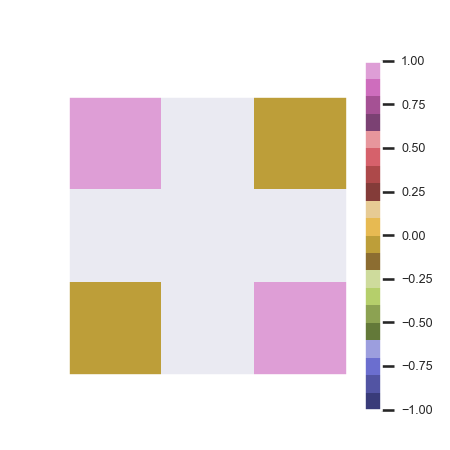

In [113]:
data0 = pd.DataFrame(({'I':final_iodine_zero_normalized,'P':final_phos_zero_normalized,'R':final_rna_zero_normalized}))
data1 = pd.DataFrame(({'I':final_iodine_one_normalized,'P':final_phos_one_normalized,'R':final_rna_one_normalized}))
data2 = pd.DataFrame(({'I':final_iodine_two_normalized,'P':final_phos_two_normalized,'R':final_rna_two_normalized}))
data3 = pd.DataFrame(({'I':final_iodine_three_normalized,'P':final_phos_three_normalized,'R':final_rna_three_normalized}))
data4 = pd.DataFrame(({'I':final_iodine_four_normalized,'P':final_phos_four_normalized,'R':final_rna_four_normalized}))
data5 = pd.DataFrame(({'I':final_iodine_five_normalized,'P':final_phos_five_normalized,'R':final_rna_five_normalized}))
data6 = pd.DataFrame(({'I':heat_map_iod,'P':heat_map_phos,'R':heat_map_rna}))
data6 = pd.DataFrame(({'I':np.log(iodine),'P':np.log(phosphorous),'R':np.log(rna)}))

f = plt.figure(figsize=(3, 3))
plt.matshow(data0.corr(), fignum=f.number,vmin = -1,vmax = 1,cmap = "tab20b")
frame1 = plt.gca()
frame1.axes.get_xaxis().set_ticks([])
frame1.axes.get_yaxis().set_ticks([])

#plt.xticks(range(data.shape[1]), data.columns, fontsize=14, rotation=45)
# plt.yticks(range(data.shape[1]), data.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=6)
#plt.title('CLuster 0', fontsize=10);

## Customized Colourmaps

In [114]:
df_p_0 = pd.DataFrame({'p_0':phos_cluster_zero})
df_p_1 = pd.DataFrame({'p_1':phos_cluster_one})
df_p_2 = pd.DataFrame({'p_2':phos_cluster_two})
df_p_3 = pd.DataFrame({'p_3':phos_cluster_three})
df_p_4 = pd.DataFrame({'p_4':phos_cluster_four})
df_p_5 = pd.DataFrame({'p_5':phos_cluster_five})

df_i_0 = pd.DataFrame({'i_0':iodine_cluster_zero})
df_i_1 = pd.DataFrame({'i_1':iodine_cluster_one})
df_i_2 = pd.DataFrame({'i_2':iodine_cluster_two})
df_i_3 = pd.DataFrame({'i_3':iodine_cluster_three})
df_i_4 = pd.DataFrame({'i_4':iodine_cluster_four})
df_i_5 = pd.DataFrame({'i_5':iodine_cluster_five})

df_r_0 = pd.DataFrame({'r_0':rna_cluster_zero})
df_r_1 = pd.DataFrame({'r_1':rna_cluster_one})
df_r_2 = pd.DataFrame({'r_2':rna_cluster_two})
df_r_3 = pd.DataFrame({'r_3':rna_cluster_three})
df_r_4 = pd.DataFrame({'r_4':rna_cluster_four})
df_r_5 = pd.DataFrame({'r_5':rna_cluster_five})

## Scaling the Data

In [115]:
iodine_cluster_zero = (iodine_cluster_zero - np.mean(phos_cluster_zero))/np.std(phos_cluster_zero)
phos_cluster_zero = (phos_cluster_zero - np.mean(phos_cluster_zero))/np.std(phos_cluster_zero)
rna_cluster_zero = (rna_cluster_zero - np.mean(phos_cluster_zero))/np.std(phos_cluster_zero)
print(np.max(phos_cluster_zero))
print(np.max(iodine_cluster_one))

iodine_cluster_one = (iodine_cluster_one  - np.mean(phos_cluster_one ))/np.std(phos_cluster_one )
phos_cluster_one  = (phos_cluster_one  - np.mean(phos_cluster_one ))/np.std(phos_cluster_one )
rna_cluster_one  = (rna_cluster_one  - np.mean(phos_cluster_one ))/np.std(phos_cluster_one )
print(np.max(phos_cluster_one))
print(np.min(iodine_cluster_one))

iodine_cluster_two = (iodine_cluster_two  - np.mean(phos_cluster_two ))/np.std(phos_cluster_two )
phos_cluster_two  = (phos_cluster_two  - np.mean(phos_cluster_two ))/np.std(phos_cluster_two )
rna_cluster_two  = (rna_cluster_two  - np.mean(phos_cluster_two ))/np.std(phos_cluster_two )
print(np.max(phos_cluster_two))
print(np.max(iodine_cluster_two))

iodine_cluster_three = (iodine_cluster_three - np.mean(phos_cluster_three ))/np.std(phos_cluster_three)
phos_cluster_three = (phos_cluster_three - np.mean(phos_cluster_three ))/np.std(phos_cluster_three )
rna_cluster_three = (rna_cluster_three - np.mean(phos_cluster_three ))/np.std(phos_cluster_three )
print(np.max(phos_cluster_three))
# print(np.min(iodine_cluster_three))

iodine_cluster_four = (iodine_cluster_four  - np.mean(phos_cluster_four ))/np.std(phos_cluster_four)
phos_cluster_four  = (phos_cluster_four - np.mean(phos_cluster_four))/np.std(phos_cluster_four)
rna_cluster_four = (rna_cluster_four  - np.mean(phos_cluster_four ))/np.std(phos_cluster_four)
print(np.max(phos_cluster_four))
print(np.max(iodine_cluster_four))

iodine_cluster_five = (iodine_cluster_five  - np.mean(phos_cluster_five ))/np.std(phos_cluster_five)
phos_cluster_five  = (phos_cluster_five  - np.mean(phos_cluster_five ))/np.std(phos_cluster_five)
rna_cluster_five  = (rna_cluster_five - np.mean(phos_cluster_five ))/np.std(phos_cluster_five)
print(np.max(phos_cluster_five))
print(np.max(iodine_cluster_five))

7.339978052293818
2
1.266197919397344
-4.858624039397775
6.08037027519735
-5.288614769476664
1.384642025344575
6.807597034569008
1.4992877917493108
1.5780437466892423
-3.545558800952068


In [116]:
cdict = {'yellow' : ((0.0,  0.0, 0.0),
                   (0.5,  0.0, 0.0),
                   (1.0,  1.0, 1.0)),
        'green': ((0.0,  0.0, 0.0),
                   (0.25, 0.0, 0.0),
                   (0.75, 1.0, 1.0),
                   (1.0,  1.0, 1.0)),
          
         'Orange':   ((0.0,  0.0, 0.0),
                   (0.5,  1.0, 1.0),
                   (1.0,  1.0, 1.0)),

         'Cyan':  ((0.0,  0.0, 0.0),
                   (0.5,  0.0, 0.0),
                   (1.0,  1.0, 1.0)),
        'Pink': ((0.0,  0.0, 0.0),
                   (0.5,  0.0, 0.0),
                   (1.0,  1.0, 1.0)),
        'Gray': ((0.0,  0.0, 0.0),
                   (0.5,  0.0, 0.0),
                   (1.0,  1.0, 1.0)),}

In [117]:
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)


In [118]:
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
colors = [(1,1,0),(0, 1, 0),( 1, 0.647,0),(0,1,1),(1,0.5,1),(0.827, 0.827, 0.827 )]  # R -> G -> B
n_bins = [3, 6, 10,15, 100]  # Discretizes the interpolation into bins
cmap_name = 'clusters'
map_yay = LinearSegmentedColormap.from_list(cmap_name, colors)
# Fewer bins will result in "coarser" colomap interpolation
cm = discrete_cmap(6, base_cmap=map_yay)

## Highlighted code

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


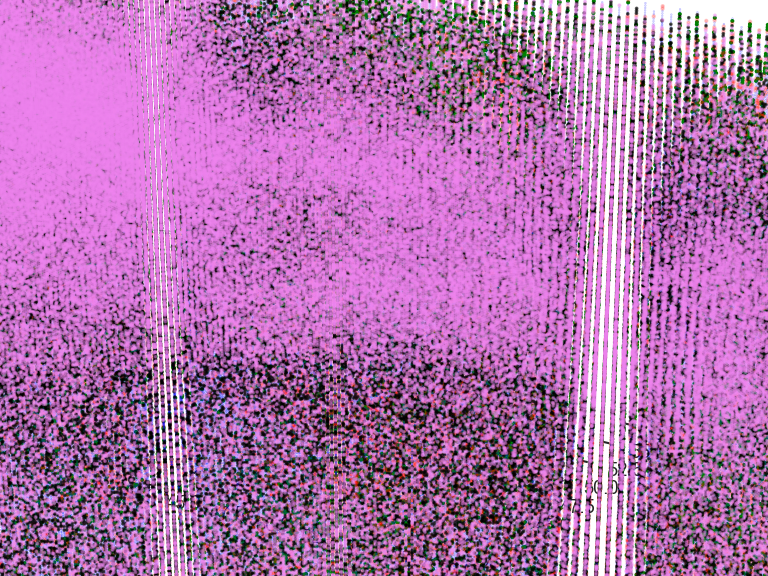

C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:42: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:43: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
C:\Users\shamb\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:44: UserWarning: Calling figure.constrained_layout, but figure not setup to do constrained layout.  You either called GridSpec without the fig keyword, you are using plt.subplot, or you need to call figure or subplots with the constrained_layout=True kwarg.


In [154]:
fig = plt.figure(constrained_layout=True)
ax = Axes3D(fig) 
# #ax.scatter3D(x_count_rna[50000:900000],y_count_rna[50000:900000],z_count_rna[50000:900000],color = "green" ,s= 2, alpha = 0.05)

ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 0.1,color = "blue", alpha = 0.3)
ax.scatter3D([x_list[i] for i in one_indices],[y_list[i] for i in one_indices],[z_list[i] for i in one_indices],s = 2,color = "violet", alpha = 0.4)
ax.scatter3D([x_list[i] for i in two_indices],[y_list[i] for i in two_indices],[z_list[i] for i in two_indices],s = 2.5,color = "red", alpha = 0.2)
ax.scatter3D([x_list[i] for i in three_indices],[y_list[i] for i in three_indices],[z_list[i] for i in three_indices],s = 1.5,color = "black", alpha = 0.6)
ax.scatter3D([x_list[i] for i in four_indices],[y_list[i] for i in four_indices],[z_list[i] for i in four_indices],s = 3, color = "pink", alpha = 0.6)
ax.scatter3D([x_list[i] for i in five_indices],[y_list[i] for i in five_indices],[z_list[i] for i in five_indices],s = 2,color = "green", alpha = 1)

#ax.scatter3D([x_list[i] for i in zeros_indices],[y_list[i] for i in zeros_indices],[z_list[i] for i in zeros_indices],s = 2,color = "red", alpha = 0.1)
#ax.set_zlim3d(0,40)                    # viewrange for z-axis should be [-4,4] 
# ax.set_ylim3d(40,60)                    # viewrange for y-axis should be [-2,2] 
# ax.set_xlim3d(40,60)  
#img = ax.scatter3D(wow_p0[:,0],wow_p0[:,1],wow_p0[:,2],c = phos_cluster_zero, cmap = cm,s = 0.07, alpha = 0.5, vmin=  -8,vmax = 8)
#img = ax.scatter3D(wow_r0[:,0],wow_r0[:,1],wow_r0[:,2],c = rna_cluster_zero, cmap = 'Set2',s = 1, alpha = 1, vmin=  -8,vmax = 8)
# img = ax.scatter3D(wow_i0[:,0],wow_i0[:,1],wow_i0[:,2],c = iodine_cluster_zero, cmap = cm,s = 1, alpha = 1, vmin=  -8,vmax = 8)


# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.grid(False)
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
plt.gca().patch.set_facecolor('white')
# Bonus: To get rid of the grid as well:

# fig.colorbar(img)
# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# ax.set_ylim(ax.get_ylim()[::-1])
# ax.set_xlim(ax.get_xlim()[::-1])
fig.tight_layout()
plt.tight_layout()
plt.savefig('cluster.png',bbox_inches='tight')
plt.show()

## Creating Arrows

In [120]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.mplot3d import proj3d
#%matplotlib inline
class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs, *args, **kwargs):
        FancyArrowPatch.__init__(self, (0,0), (0,0), *args, **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        xs, ys, zs = proj3d.proj_transform(xs3d, ys3d, zs3d, renderer.M)
        self.set_positions((xs[0],ys[0]),(xs[1],ys[1]))
        FancyArrowPatch.draw(self, renderer)

In [121]:
def standardize_fn(X):
    scaler = StandardScaler() 
    X_scaled = scaler.fit_transform(X) 
    X_normalized = normalize(X_scaled) 
    X_normalized = pd.DataFrame(X_normalized) 
    return X_normalized

In [122]:
def extract_image3D(files,slices,b,c):
    iod_value = [] 
    # phosphorous = [] 
    # rna = [] 
    x_count_iod = []
    y_count_iod = []
    z_count_iod = []
    for k in slices:
        zeros = 0
        iod_1 = tifffile.imread(files[k])[b,c]
        w,h = np.shape(iod_1)
        for i in range(w):
            for j in range(h): 
                if iod_1[i,j] == 0:
                    continue
                else: 
                    iod_value.append(iod_1[i,j])
                    x_count_iod.append(i)
                    y_count_iod.append(j)
                    z_count_iod.append(k)
    return iod_value,x_count_iod,y_count_iod,z_count_iod

In [123]:
def centroid_computation(value,x_count,y_count,z_count,p):
    x = 0
    y = 0
    z = 0 
    for i in p:
        x += value[i] * np.array([x_count[i]])
        y += value[i] * np.array([y_count[i]])
        z += value[i] * np.array([z_count[i]])
    lol = np.sum([value[i] for i in p])
    centroid_x = x/lol
    centroid_y = y/lol
    centroid_z = z/lol    
    return centroid_x ,centroid_y ,centroid_z

In [124]:
def cube_centroid(x,y,z,vx,vy,vz,rna_ac,iod_ac,phos_ac):
    rna_indices =[]
    phos_indices = [] 
    iod_indices = []
    for i in range(len(rna_ac)):
        if rna_ac[i][0] >= x and rna_ac[i][0] <= x + vx and rna_ac[i][1] >= y and rna_ac[i][1] <= y + vy  and rna_ac[i][2] >= z and rna_ac[i][2] <= z + vz:
            rna_indices.append(i)
    for i in range(len(iod_ac)):
        if iod_ac[i][0] >= x and iod_ac[i][0] <= x + vx and iod_ac[i][1] >= y and iod_ac[i][1] <= y + vy  and iod_ac[i][2] >= z and iod_ac[i][2] <= z + vz:
            iod_indices.append(i)
    for i in range(len(phos_ac)):
        if phos_ac[i][0] >= x and phos_ac[i][0] <= x + vx and phos_ac[i][1] >= y and phos_ac[i][1] <= y + vy  and phos_ac[i][2] >= z and phos_ac[i][2] <= z + vz:
            phos_indices.append(i)
    rna_now = [rna_ac[i] for i in rna_indices] 
    phos_now = [phos_ac[i] for i in phos_indices] 
    iod_now = [iod_ac[i] for i in iod_indices] 
    p = np.array(range(len(rna_now)))
    q = np.array(range(len(phos_now)))
    r = np.array(range(len(iod_now)))
    rna_now = np.array(rna_now)
    iod_now = np.array(iod_now)
    phos_now = np.array(phos_now)
    cent_r = np.zeros(3)
    cent_p = np.zeros(3)
    cent_i = np.zeros(3)
    cent_r[0],cent_r[1],cent_r[2] = centroid_computation(rna_now[:,3],rna_now[:,0],rna_now[:,1],rna_now[:,2],p)
    cent_p[0],cent_p[1],cent_p[2] = centroid_computation(phos_now[:,3],phos_now[:,0],phos_now[:,1],phos_now[:,2],q)
    cent_i[0],cent_i[1],cent_i[2] = centroid_computation(iod_now[:,3],iod_now[:,0],iod_now[:,1],iod_now[:,2],r)
    return cent_r,cent_p,cent_i

In [125]:
slices = np.arange(100,201,1)#enter the rnage of slices you want to see
u = 100 #enter the initial value for pixel vale 
b,c = np.meshgrid(np.arange(u,u+30,1),np.arange(u,u+30,1))
iod_value,x_count_iod,y_count_iod,z_count_iod = extract_image3D(tif_file_iod,slices,b,c)
phos_value,x_count_phos,y_count_phos,z_count_phos = extract_image3D(tif_file_phos,slices,b,c)
rna_value,x_count_rna,y_count_rna,z_count_rna = extract_image3D(tif_file_rna,slices,b,c)
rna_ac = np.c_[x_count_rna,y_count_rna,z_count_rna,rna_value]
iod_ac = np.c_[x_count_iod,y_count_iod,z_count_iod,iod_value]
phos_ac = np.c_[x_count_phos,y_count_phos,z_count_phos,phos_value]

## Slight modifications required as different approach in parent code(Will update!)

In [126]:
# rna_indices =[]
# phos_indices = [] 
# iod_indices = []
# n = 3
# cent_r = np.zeros((n**2,3))
# cent_p = np.zeros((n**2,3))
# cent_i = np.zeros((n**2,3))
# x = 0
# y = 0
# z = np.min(slices)
# vx = np.floor(min(max(x_count_rna),max(x_count_phos),max(x_count_iod))/n)
# vy = np.floor(min(max(y_count_rna),max(y_count_phos),max(y_count_iod))/n)
# vz = np.floor(min(max(z_count_rna),max(z_count_phos),max(z_count_iod))/n)
# for i in range(n**2):
#     print(i)
#     print(x,y,z,vx,vy,vz,rna_ac,iod_ac,phos_ac)
#     c_r,c_p,c_i = cube_centroid(x,y,z,vx,vy,vz,rna_ac,iod_ac,phos_ac)
#     cent_r[i] = c_r
#     cent_p[i] = c_p
#     cent_i[i] = c_i
#     x = x + vx
#     y = y + vy 
#     z = z + vz

In [127]:
# %matplotlib notebook
# fig = plt.figure()
# ax = Axes3D(fig)
# ax.scatter3D(x_count_rna,y_count_rna,z_count_rna, c = 'red',s= 1,alpha = 0.2)
# ax.scatter3D(x_count_iod,y_count_iod,z_count_iod, c = 'green',s = 1,alpha = 0.2)

# k = 14
# l = 0.3

# for i in range(n**2):
#     ax.scatter3D(cent_i[i,0],cent_i[i,1],cent_i[i,2],color = 'purple')
#     ax.scatter3D(cent_r[i,0],cent_r[i,1],cent_r[i,2],color = 'blue')
#     # ax.scatter3D(cent_p[i,0],cent_p[i,1],cent_p[i,2],color = 'gray')
#     q = ax.quiver3D(cent_i[i,0],cent_i[i,1],cent_i[i,2],cent_r[i,0] - cent_i[i,0] ,cent_r[i,1] - cent_i[i,1],cent_r[i,2] - cent_i[i,2],length=k,arrow_length_ratio=l,color = (0,0,0), normalize=True)
#     #q = ax.quiver3D(cent_r[i,0],cent_r[i,1],cent_r[i,2],cent_i[i,0] - cent_r[i,0] ,cent_i[i,1] - cent_r[i,1],cent_i[i,2] - cent_r[i,2],length=k,arrow_length_ratio=l,color = (0,0,0), normalize=True)


# # ax.set_zlim3d(0,30)                    # vilewrange for z-axis should be [-4,4] 
# # ax.set_ylim3d(0,18)                    # viewrange for y-axis should be [-2,2] 
# # ax.set_xlim3d(0,18)

# ax.xaxis.pane.fill = False
# ax.yaxis.pane.fill = False
# ax.zaxis.pane.fill = False

# # Now set color to white (or whatever is "invisible")
# ax.grid(False)
# ax.xaxis.pane.set_edgecolor('w')
# ax.yaxis.pane.set_edgecolor('w')
# ax.zaxis.pane.set_edgecolor('w')
# ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
# plt.gca().patch.set_facecolor('white')
# # Bonus: To get rid of the grid as well:

# frame1 = plt.gca()
# frame1.axes.get_xaxis().set_ticks([])
# frame1.axes.get_yaxis().set_ticks([])
# frame1.axes.get_zaxis().set_ticks([])
# plt.show()